In [1]:
import sys
import scipy.io
import numpy as np
import scipy.stats as st
import matplotlib.pyplot as plt
import pandas as pd
from PIL import ImageColor

Preprocessing:

Load the csv and sort all of the user inputs by timestamp.
Set up a color reference function (color_index)

In [93]:
path = 'tile_placements.csv'
df = pd.read_csv(path)
df = df.sort_values('ts').reset_index(drop=True)

# 16.559.897 datapoints, 1.200.000 users
# ts (ms), user hash, x coordinate, y coordinate, color

max_time = df['ts'].max()
min_time = df['ts'].min()
print(min_time)
time = max_time - min_time

df['ts'] = df['ts'] - min_time
print(df)

1490918688000
                 ts                          user  x_coordinate  y_coordinate  \
0                 0  2puPLvQ6X2zTSpfBkHXhxlIVo40=           505           510   
1             40000  2puPLvQ6X2zTSpfBkHXhxlIVo40=           490           504   
2             93000  2puPLvQ6X2zTSpfBkHXhxlIVo40=           518           498   
3            649000  GP2B74SRyrZ3HIflSFoAzM+jS3U=           474           495   
4            661000  GP2B74SRyrZ3HIflSFoAzM+jS3U=           477           495   
5            673000  GP2B74SRyrZ3HIflSFoAzM+jS3U=           472           496   
6            691000  GP2B74SRyrZ3HIflSFoAzM+jS3U=           473           497   
7            710000  GP2B74SRyrZ3HIflSFoAzM+jS3U=           474           498   
8            722000  GP2B74SRyrZ3HIflSFoAzM+jS3U=           475           498   
9            738000  GP2B74SRyrZ3HIflSFoAzM+jS3U=           476           498   
10           777000  GP2B74SRyrZ3HIflSFoAzM+jS3U=           477           498   
11           7

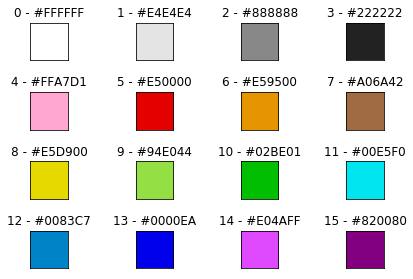

In [94]:
# 0 #FFFFFF
#1  #E4E4E4
#2  #888888
#3  #222222
#4  #FFA7D1
#5  #E50000
#6  #E59500
#7  #A06A42
#8  #E5D900
#9  #94E044
#10  #02BE01
#11  #00E5F0
#12  #0083C7
#13  #0000EA
#14  #E04AFF
#15  #820080

def color_index(index):
    colors = ['#FFFFFF', '#E4E4E4', '#888888', '#222222', '#FFA7D1', '#E50000', '#E59500', '#A06A42',
              '#E5D900', '#94E044', '#02BE01',  '#00E5F0', '#0083C7', '#0000EA', '#E04AFF', '#820080']
    hex_col = colors[index]
    
    return ImageColor.getcolor(hex_col, "RGB")  



colors = ['#FFFFFF', '#E4E4E4', '#888888', '#222222', '#FFA7D1', '#E50000', '#E59500', '#A06A42',
              '#E5D900', '#94E044', '#02BE01',  '#00E5F0', '#0083C7', '#0000EA', '#E04AFF', '#820080']
fig, axs = plt.subplots(4, 4)
fig.tight_layout()

# Add 9 example colors
axs[0, 0].imshow([[color_index(0)]])
axs[0, 0].set_title('0 - ' + colors[0])
axs[0, 1].imshow([[color_index(1)]])
axs[0, 1].set_title('1 - ' + colors[1])
axs[0, 2].imshow([[color_index(2)]])
axs[0, 2].set_title('2 - ' + colors[2])
axs[0, 3].imshow([[color_index(3)]])
axs[0, 3].set_title('3 - ' + colors[3])

axs[1, 0].imshow([[color_index(4)]])
axs[1, 0].set_title('4 - ' + colors[4])
axs[1, 1].imshow([[color_index(5)]])
axs[1, 1].set_title('5 - ' + colors[5])
axs[1, 2].imshow([[color_index(6)]])
axs[1, 2].set_title('6 - ' + colors[6])
axs[1, 3].imshow([[color_index(7)]])
axs[1, 3].set_title('7 - ' + colors[7])

axs[2, 0].imshow([[color_index(8)]])
axs[2, 0].set_title('8 - ' + colors[8])
axs[2, 1].imshow([[color_index(9)]])
axs[2, 1].set_title('9 - ' + colors[9])
axs[2, 2].imshow([[color_index(10)]])
axs[2, 2].set_title('10 - ' + colors[10])
axs[2, 3].imshow([[color_index(11)]])
axs[2, 3].set_title('11 - ' + colors[11])
                 
axs[3, 0].imshow([[color_index(12)]])
axs[3, 0].set_title('12 - ' + colors[12])
axs[3, 1].imshow([[color_index(13)]])
axs[3, 1].set_title('13 - ' + colors[13])
axs[3, 2].imshow([[color_index(14)]])
axs[3, 2].set_title('14 - ' + colors[14])
axs[3, 3].imshow([[color_index(15)]])
axs[3, 3].set_title('15 - ' + colors[15])


# Remove the ticks 
for row in axs:
    for ax in row:
        ax.set_xticks([])
        ax.set_yticks([])
plt.show()


Display the sorted and usorted dataset

In [121]:
def display_on_canvas(dataframe):
    canvas = np.ones([1001,1001,3])*255
    for index, row in dataframe.iterrows():   
        y = row['x_coordinate']
        x = row['y_coordinate']
        col = row['color']
        canvas[x,y] = color_index(col)

        if index % 500000 == 0:
            print(index, x, y, col)

    canvas = canvas / 255

    plt.figure(figsize = (17,17))
    plt.imshow(canvas, vmin=0, vmax=255)
    plt.axis("off") 
    plt.show()

In [97]:
def read_image_coordinates(file_name):
    images = []
    with open(file_name) as f:
        lines = f.readlines()
    
    for i in range(len(lines)):        
        if i != 0:
            image = lines[i]
            image_list = image.rstrip("\n")
            image_list = image_list.split(",")
            
            # Cast strings to integers
            image_list[3] = int(image_list[3])
            image_list[4] = int(image_list[4])
            
            # Cast indices 1 and 2 to tuple
            left = int(image_list[1].replace('(', ''))
            right = int(image_list[2].replace(')', ''))
            image_list[1] = (left, right)
            del image_list[2]            
                    
            images.append(image_list)
            
    
    # Return all except header of file
    return images

In [98]:
def write_list_of_lists_to_file(file_name, list_of_lists):
    textfile = open(file_name, "w")
    for list_element in list_of_lists:
        for index, element in enumerate(list_element):
            if index == len(list_element)-1:
                textfile.write(str(element))
            else:
                textfile.write(str(element) + ",")
        textfile.write("\n")
    textfile.close()

In [99]:
def filter_image_from_df(image, df):
    x = image[1][0]
    y = image[1][1]
    x_len = image[2]
    y_len = image[3]
    
    # Filter out coordinates not within the ranges of the image
#     image_df = df[df['x_coordinate']>= x]
#     image_df = image_df[image_df['x_coordinate']<= x+x_len]
    image_df = df[(df['x_coordinate'] >= x) & (df['x_coordinate'] <= x+x_len)]

    
#     image_df = image_df[image_df['y_coordinate']>= y]
#     image_df = image_df[image_df['y_coordinate']<= y+y_len]
    image_df = image_df[(image_df['y_coordinate'] >= y) & (image_df['y_coordinate'] <= y+y_len)]
    
    return image_df    

In [100]:
def calculate_image_activity_ratio(image, image_dataframe, image_users_dataframe):
    x = image[1][0]
    y = image[1][1]
    x_len = image[2]
    y_len = image[3]
       
    
    # Remove coordinates within the ranges of the image
#     x_1 = image_users_dataframe['x_coordinate'] >= x
#     x_2 = image_users_dataframe['x_coordinate'] <= x+x_len
#     y_1 = image_users_dataframe['y_coordinate'] >= y
#     y_2 = image_users_dataframe['y_coordinate'] <= y+y_len
    
#     filtered_dataframe = image_users_dataframe[~(x_1 & x_2) | ~y_1 | ~y_2]
    
    
    # Calculate ratio of activity inside and outside the image borders 
    filtered_activity = len(image_dataframe.index)
    image_user_activity = len(image_users_dataframe.index)
    
    if image_user_activity == 0:
        return 0
    
    else:
         return filtered_activity / image_user_activity

In [101]:
def create_timepoints(max_timepoint):
    timepoints = np.arange(1,max_timepoint+1,1, dtype=int)
    timepoints = [x/72 for x in timepoints]
    return timepoints

In [102]:
def obtain_users_from_df(dataframe):
    # Returns list of unique users
    return dataframe.drop_duplicates(subset='user', keep="first")['user'].tolist()

In [13]:
def gather_all_users_from_df(dataframe, user_list):
    return dataframe[dataframe['user'].isin(user_list)]

hour:  0
0 510 505 1


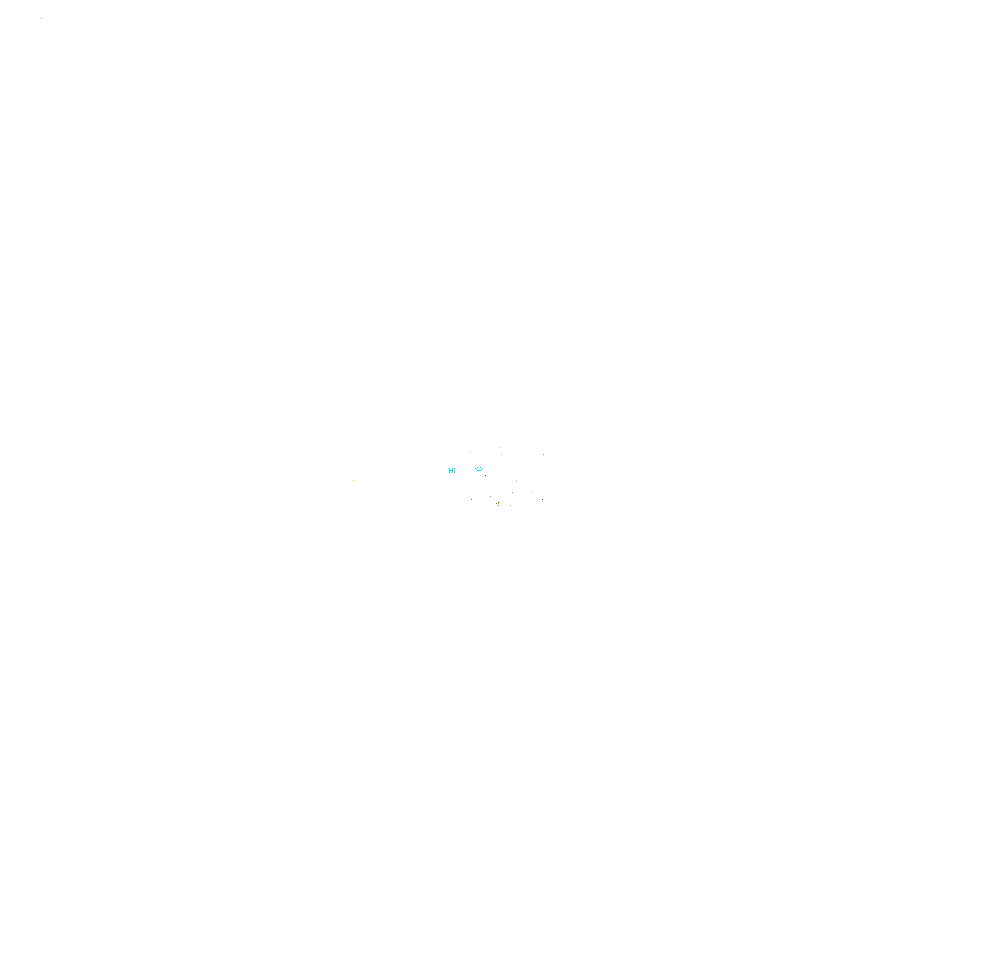

hour:  1
0 510 505 1


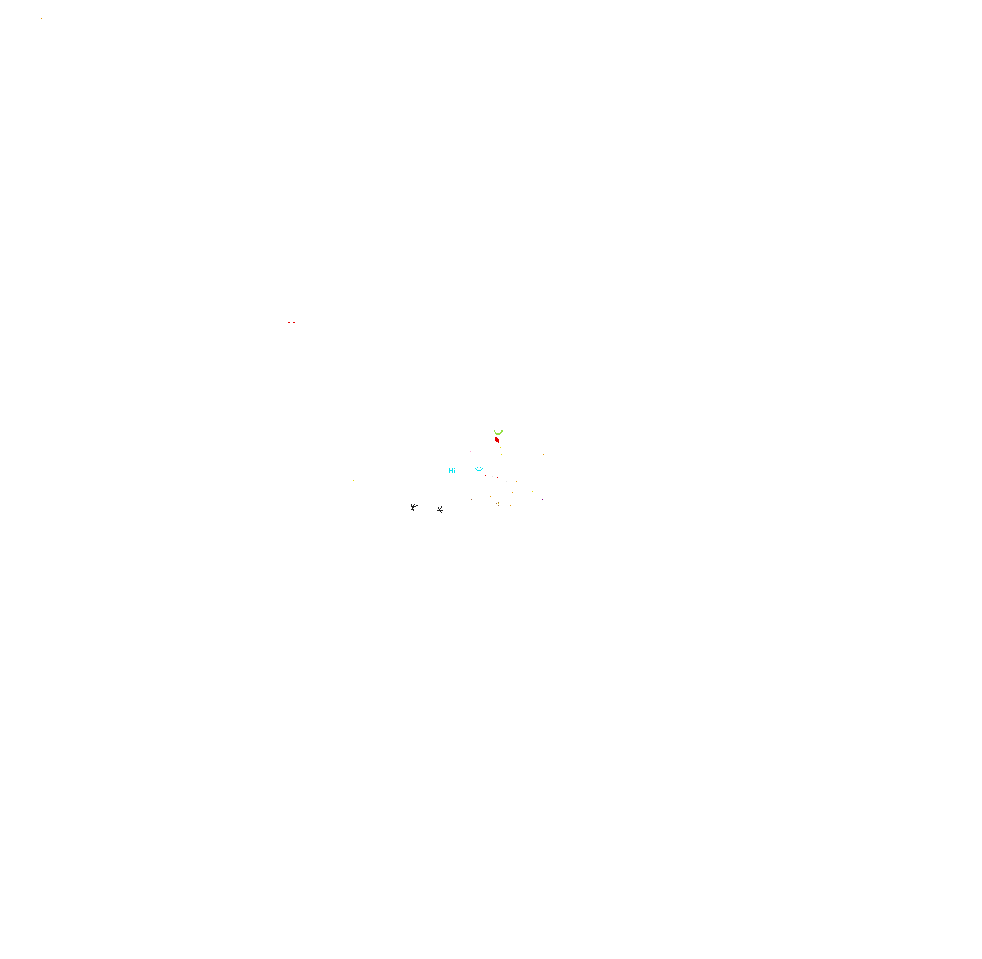

hour:  2
0 510 505 1


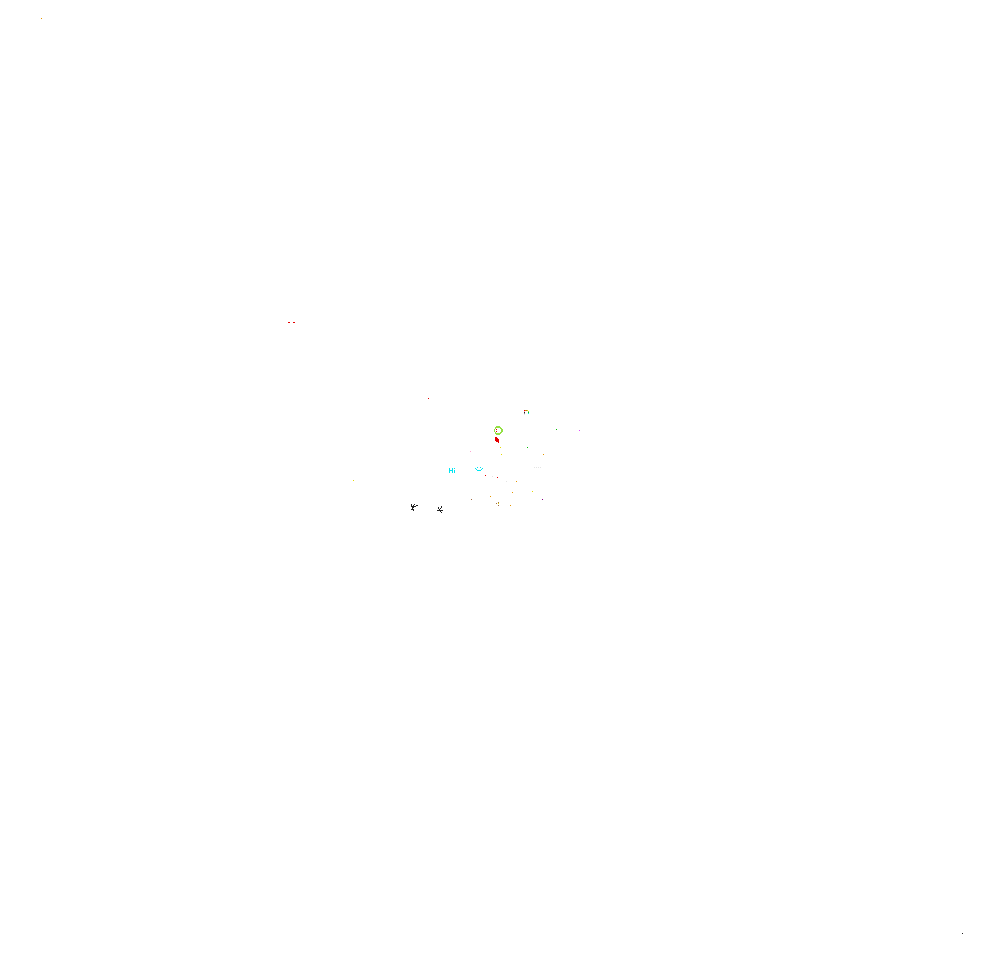

hour:  3
0 510 505 1


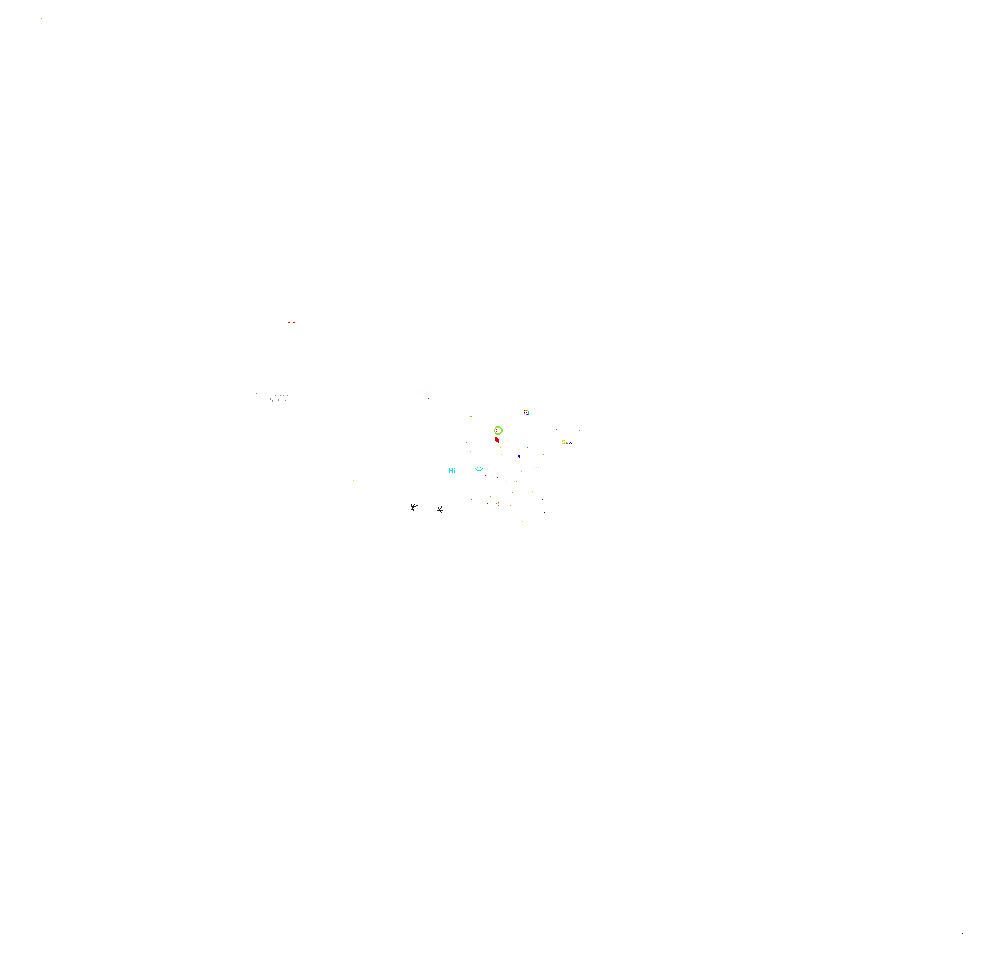

hour:  4
0 510 505 1


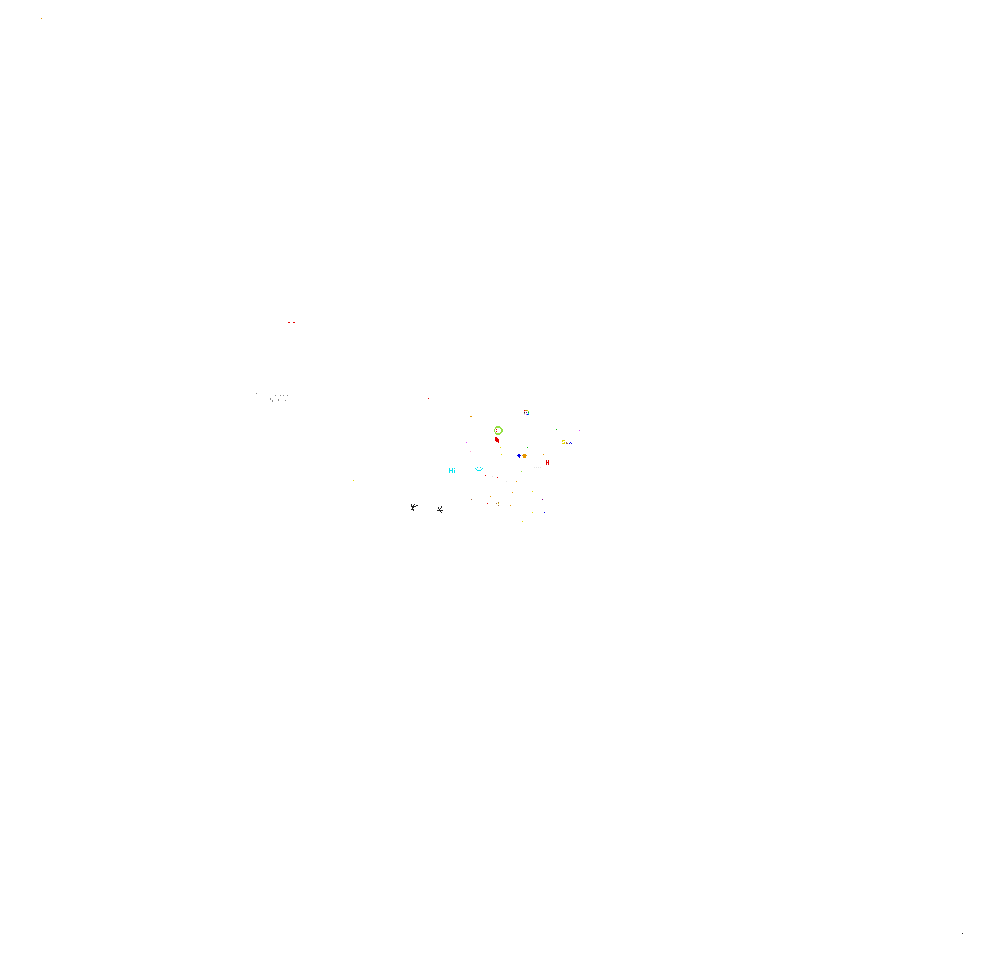

hour:  5
0 510 505 1


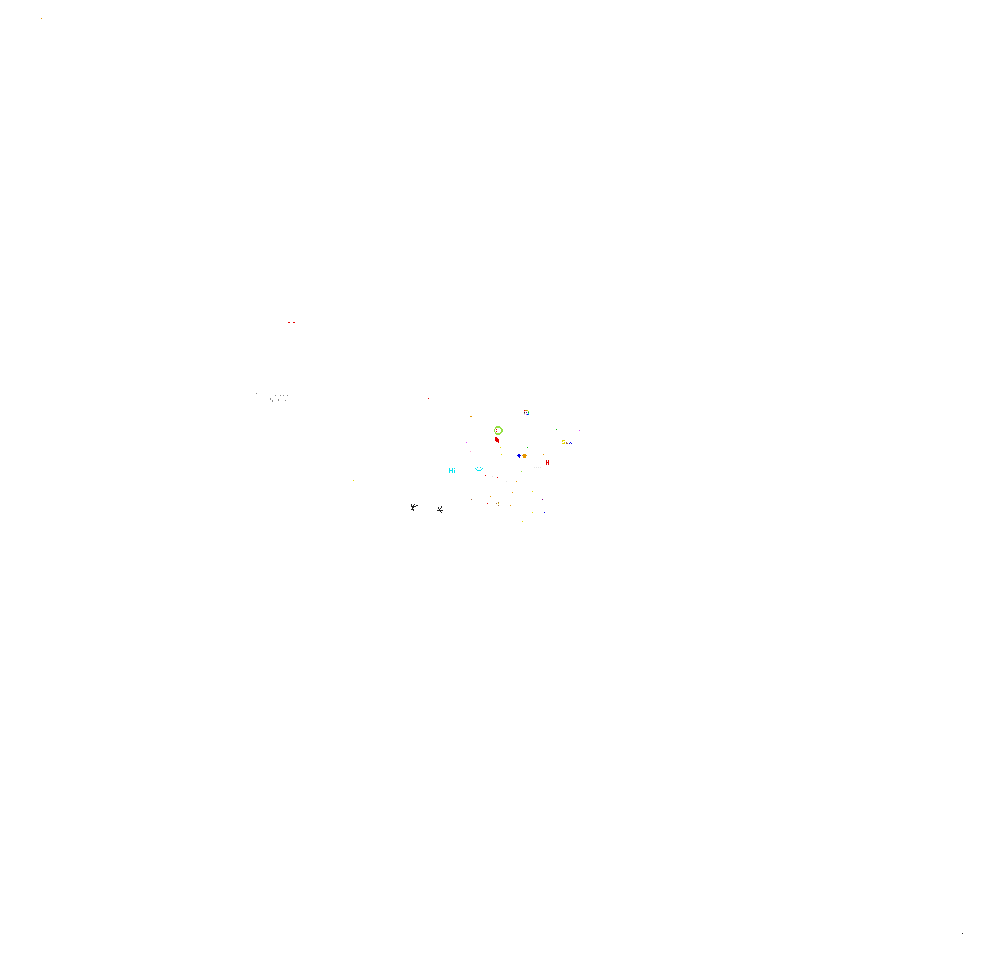

hour:  6
0 510 505 1


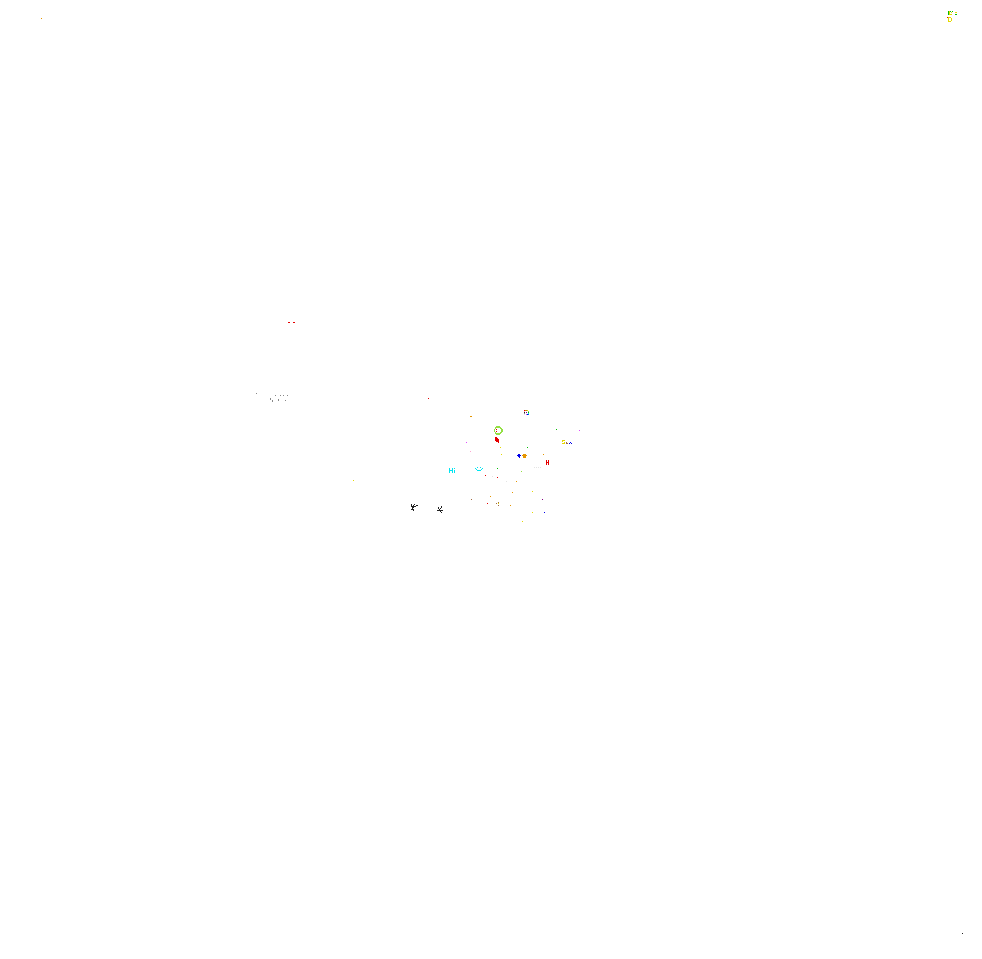

hour:  7
0 510 505 1


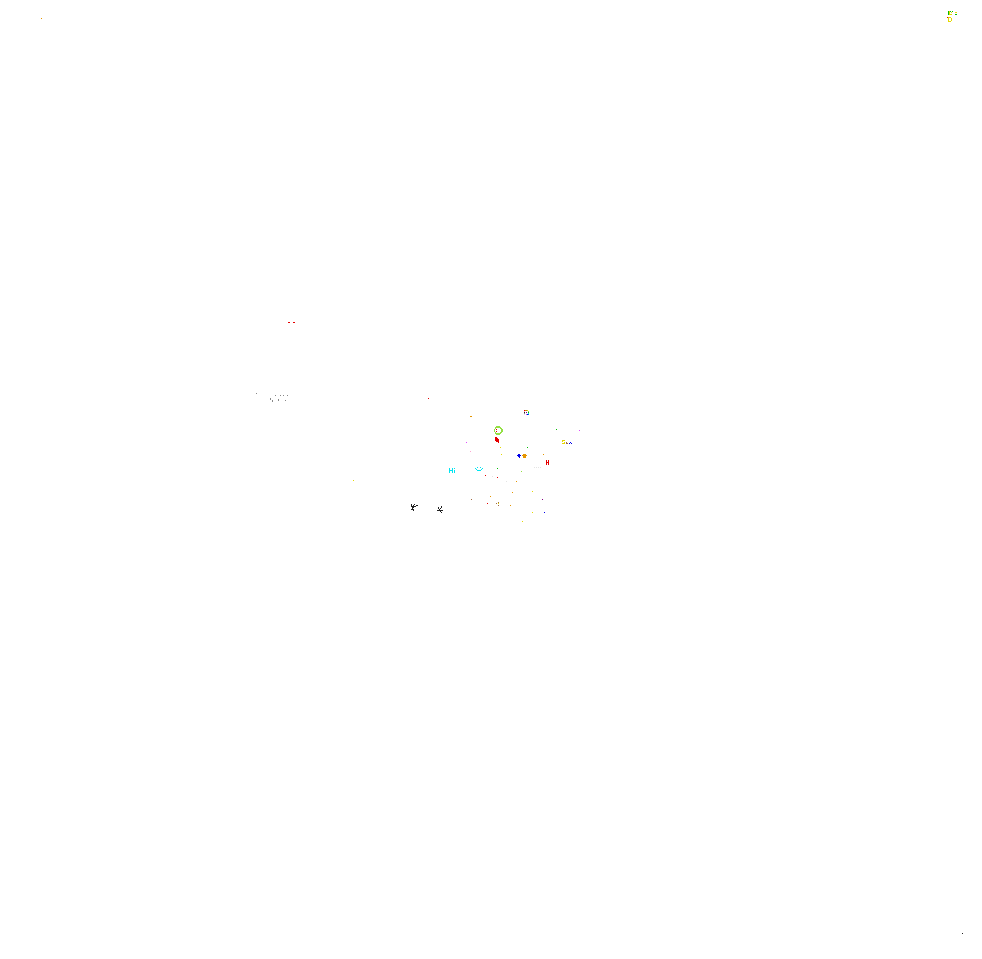

hour:  8
0 510 505 1


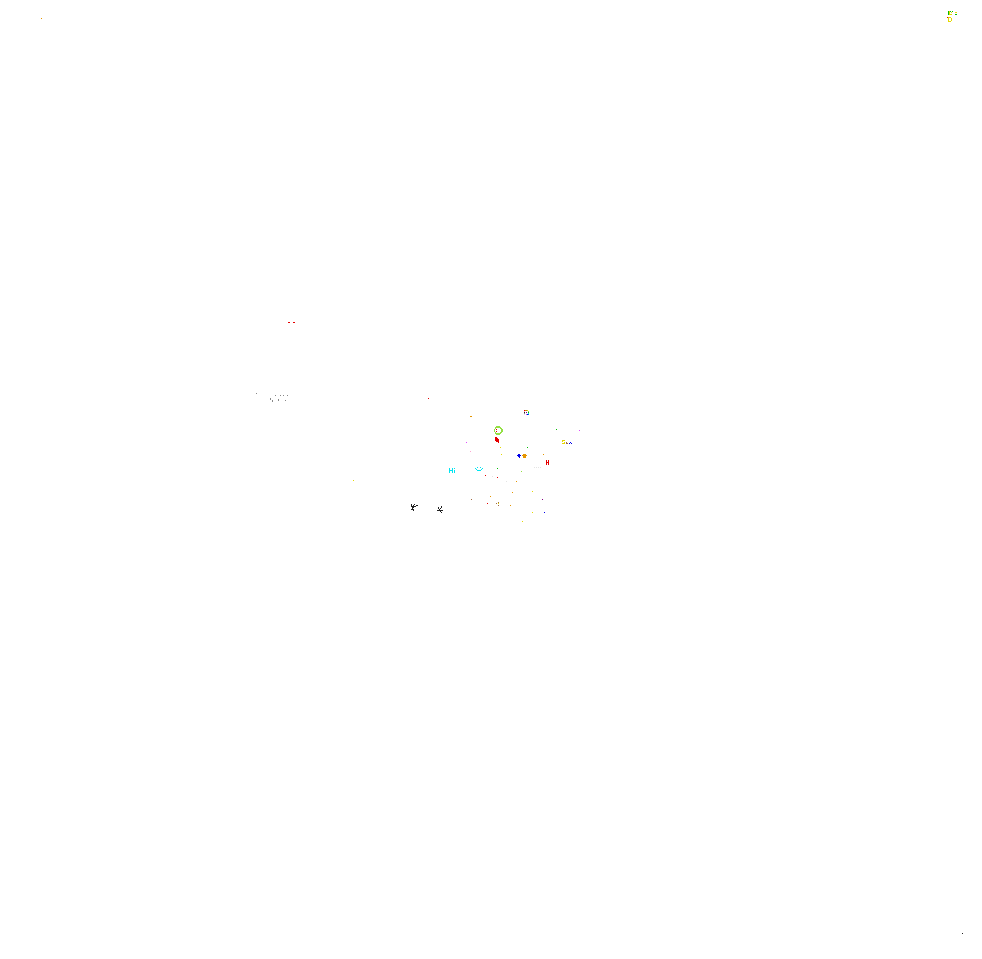

hour:  9
0 510 505 1


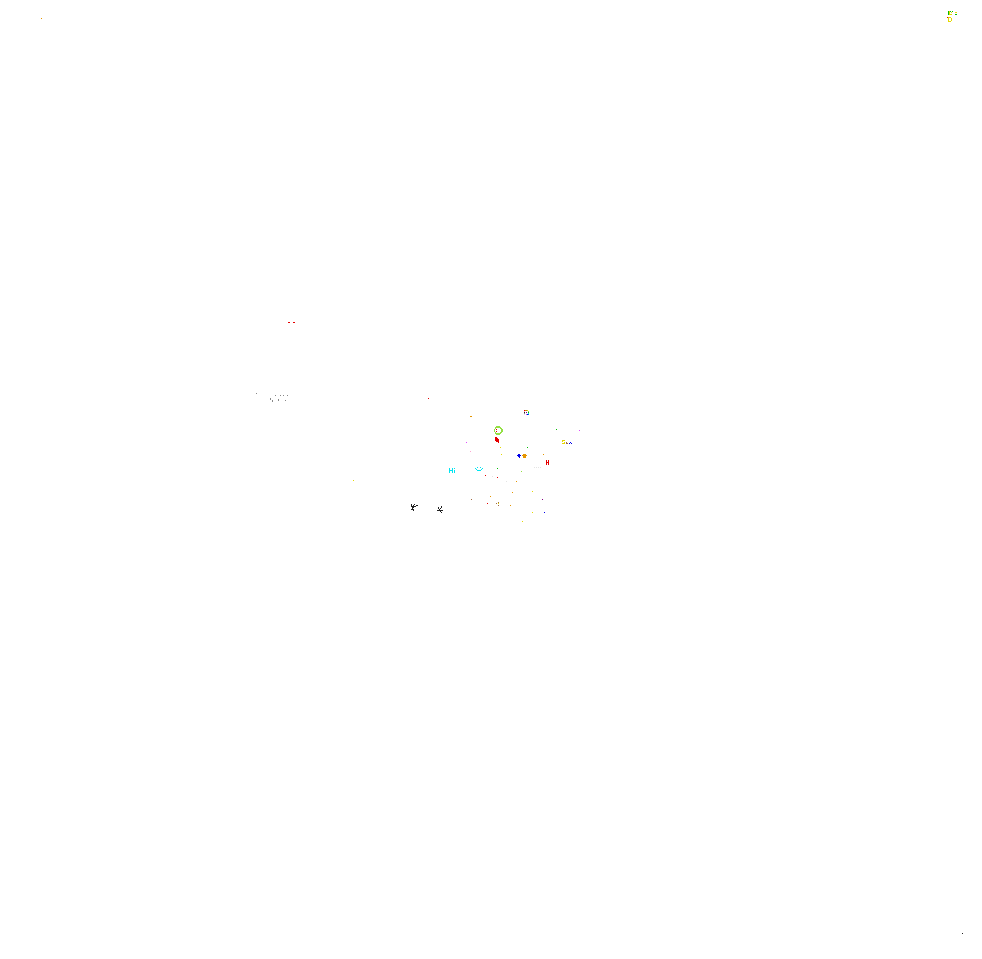

hour:  10
0 510 505 1


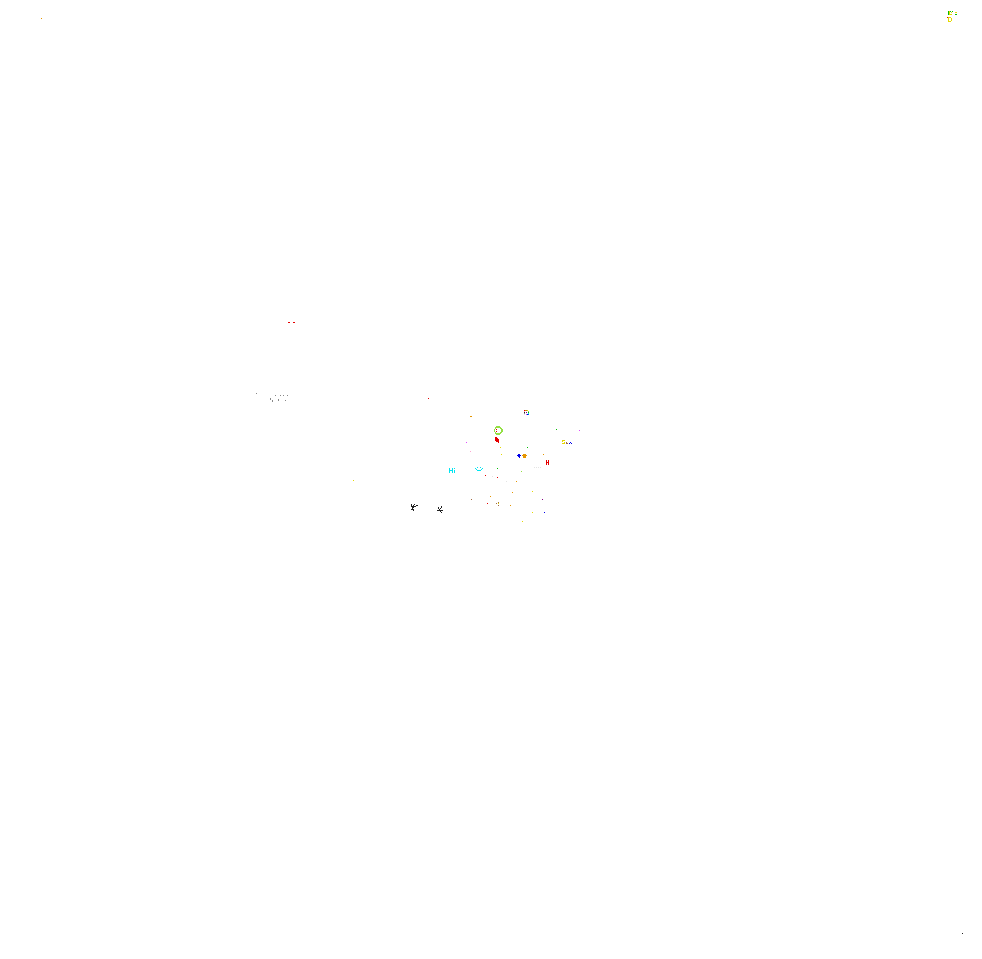

hour:  11
0 510 505 1


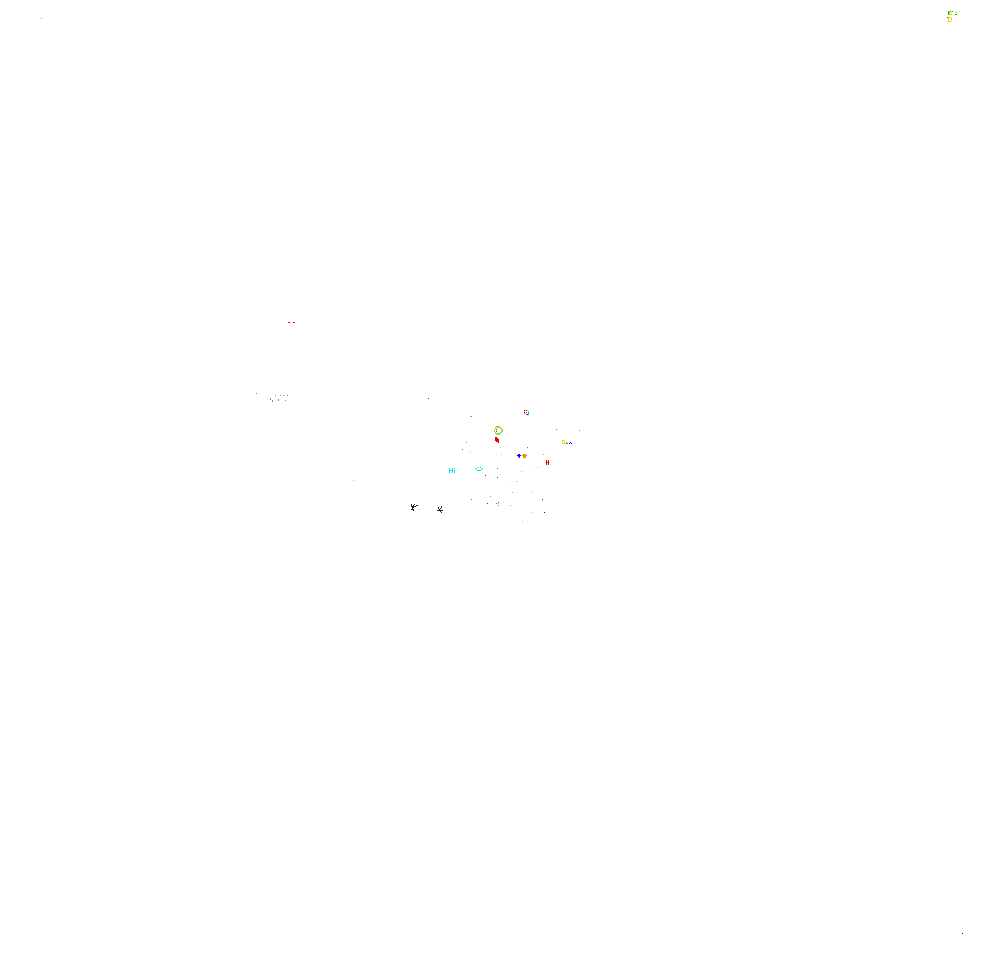

hour:  12
0 510 505 1


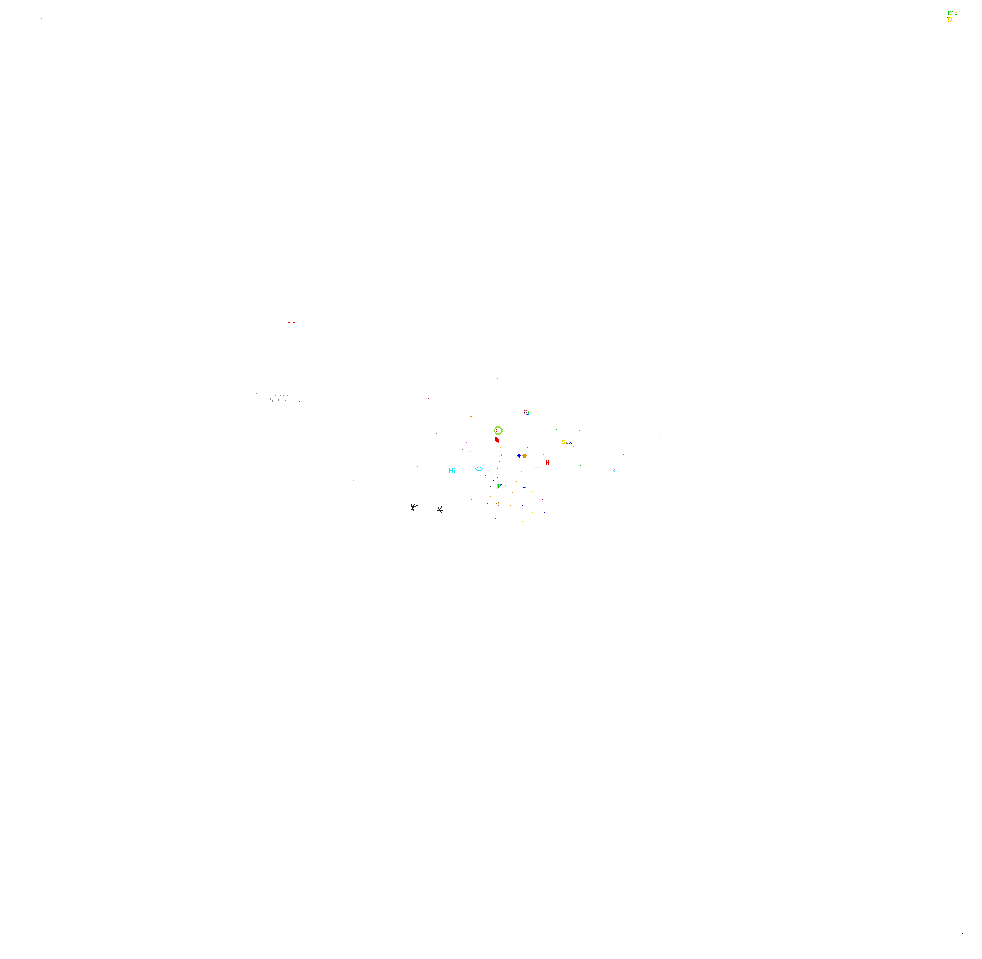

hour:  13
0 510 505 1


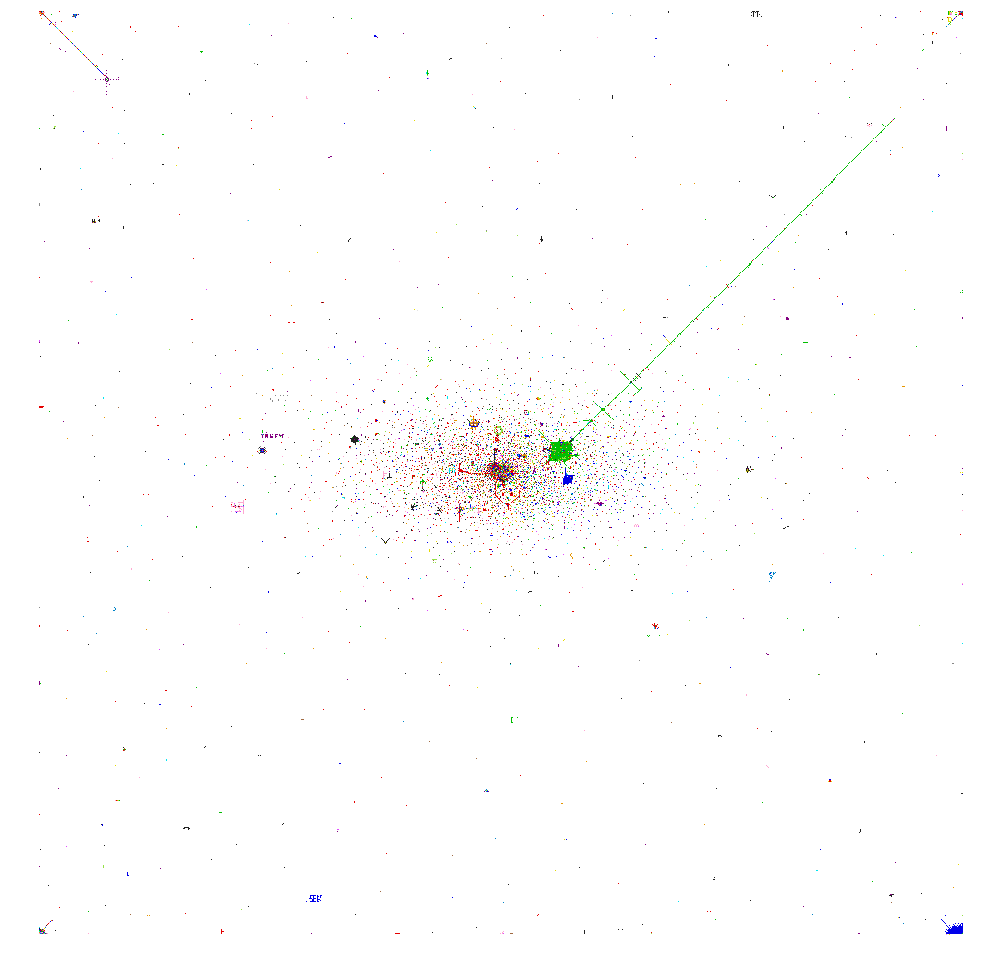

hour:  14
0 510 505 1


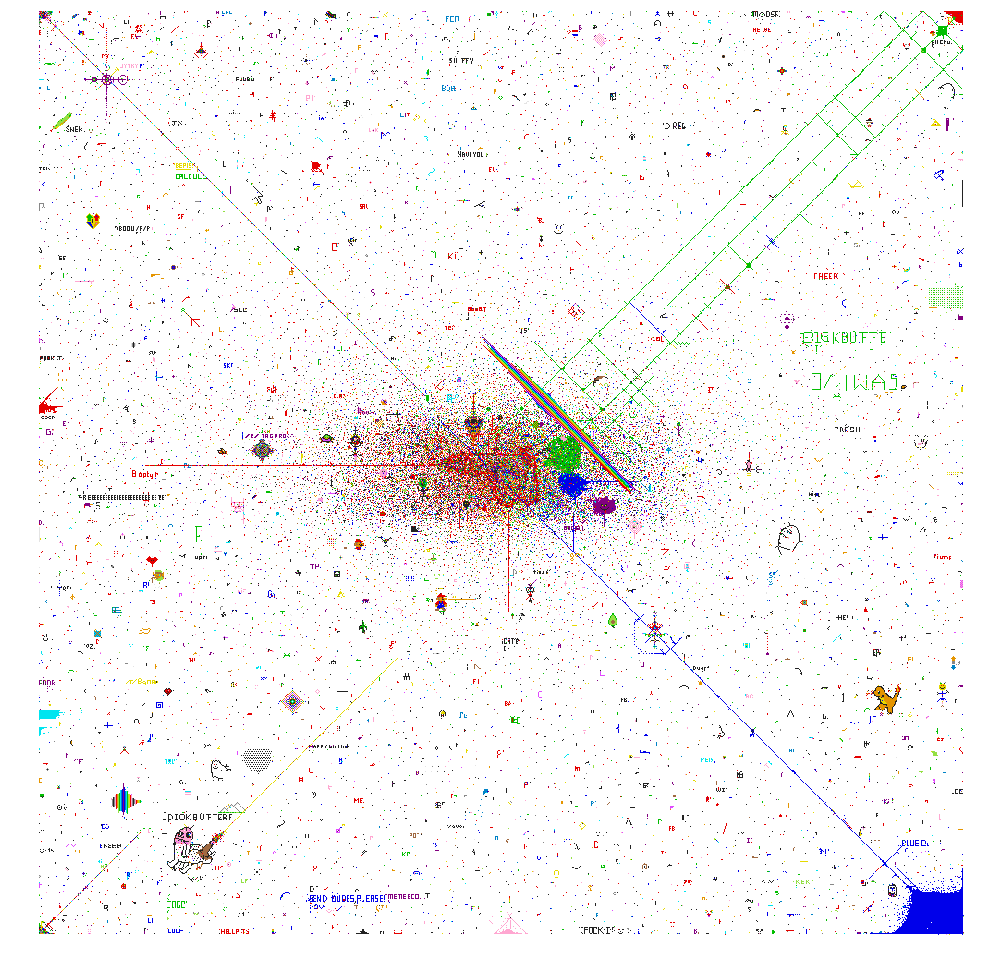

hour:  15
0 510 505 1


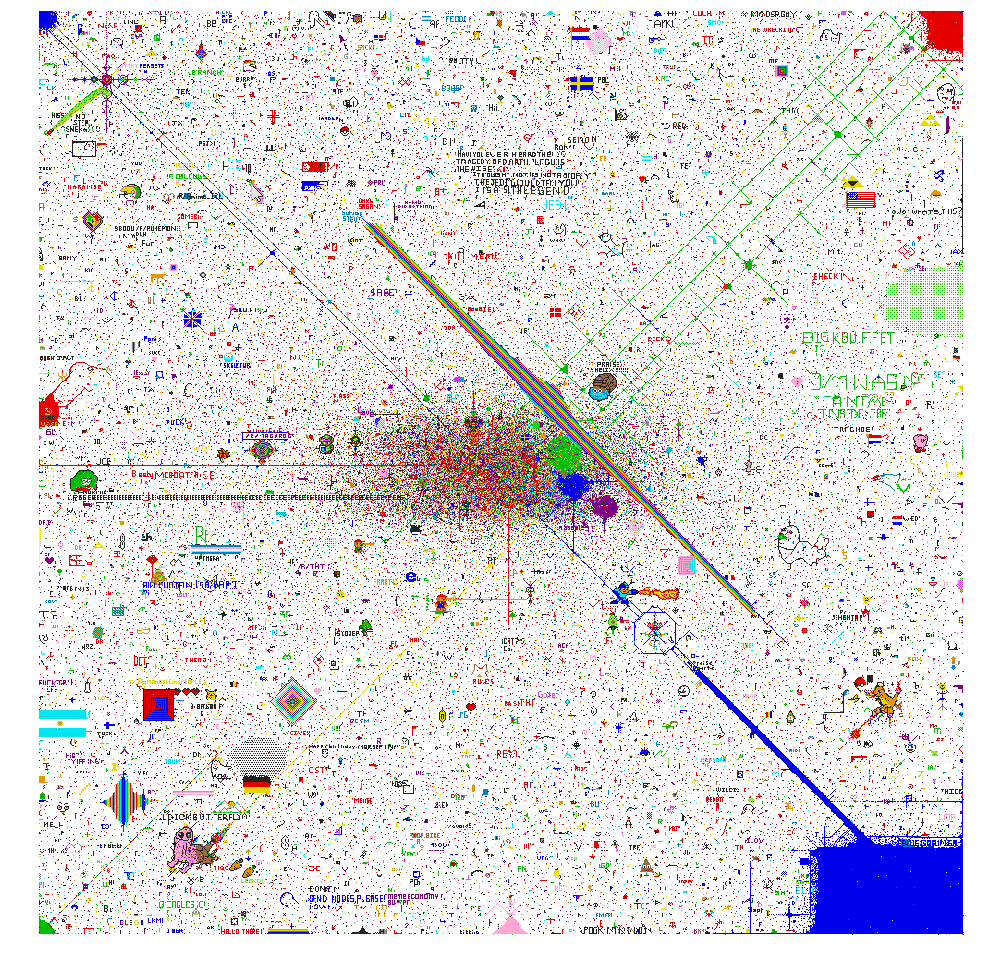

hour:  16
0 510 505 1
500000 950 842 13


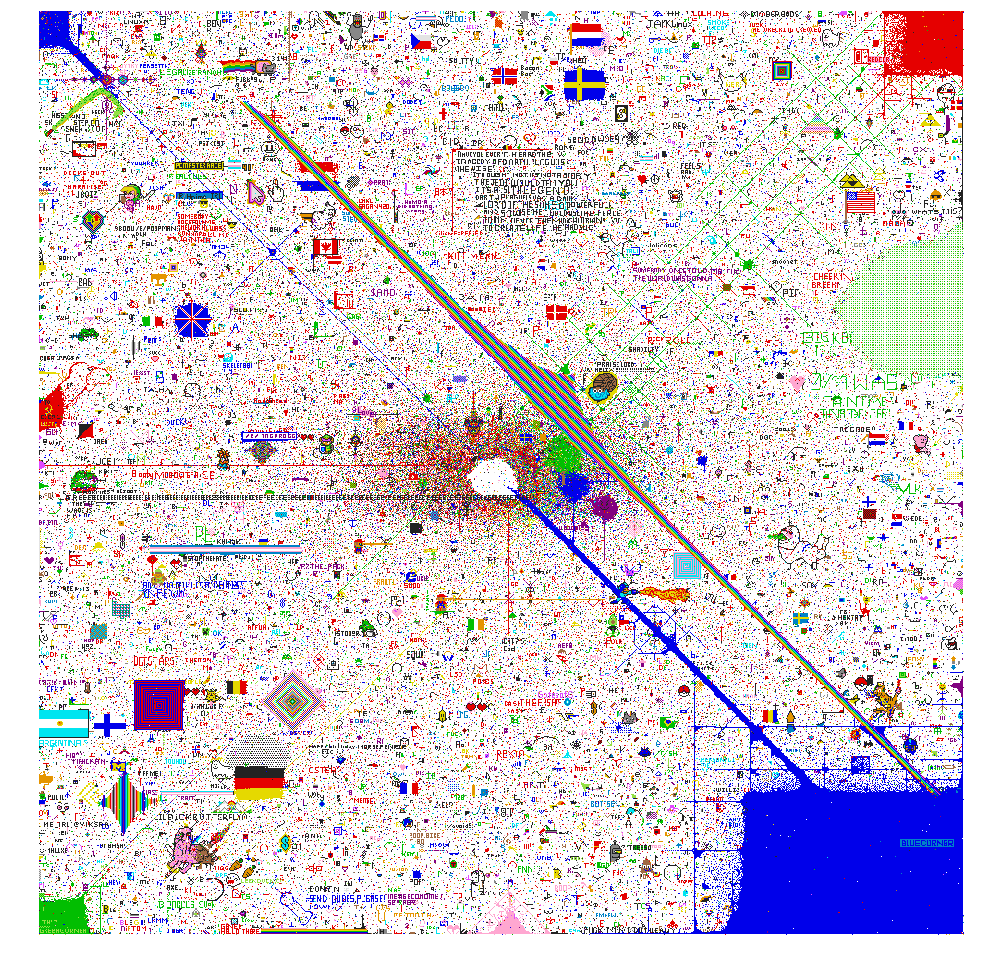

hour:  17
0 510 505 1
500000 950 842 13


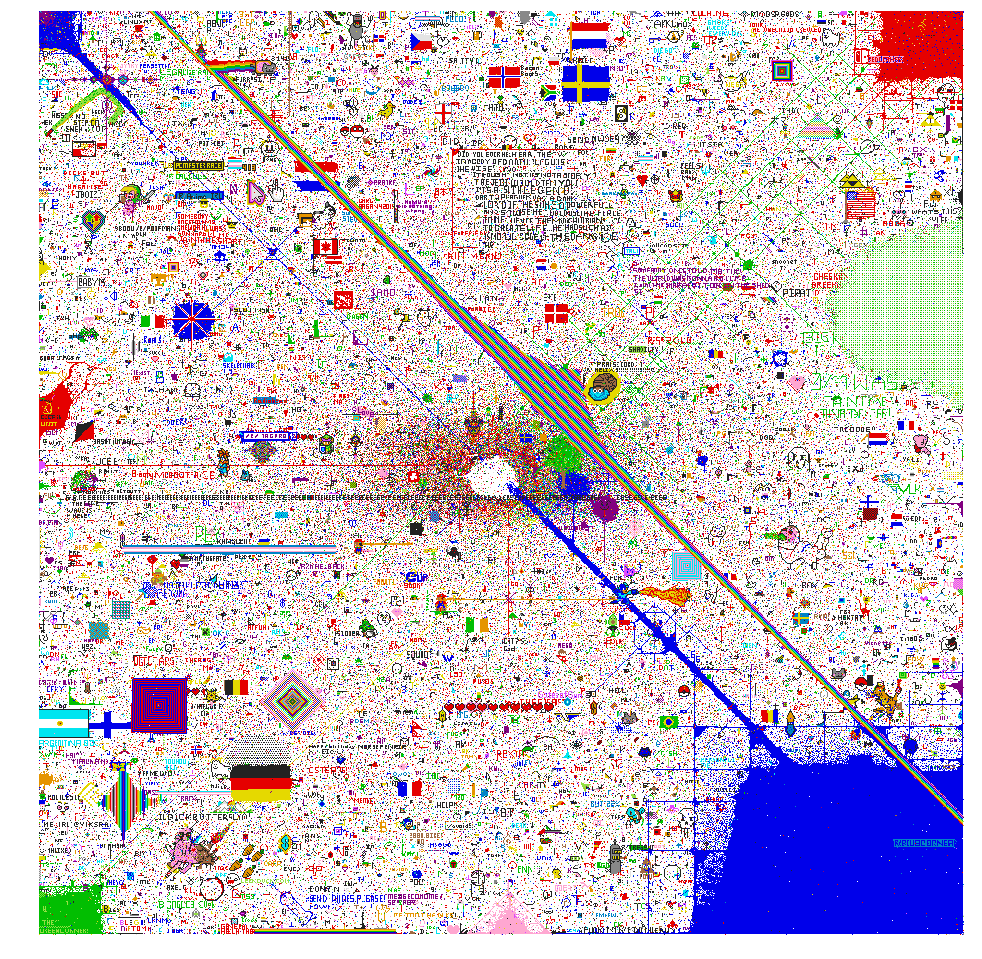

hour:  18
0 510 505 1
500000 950 842 13


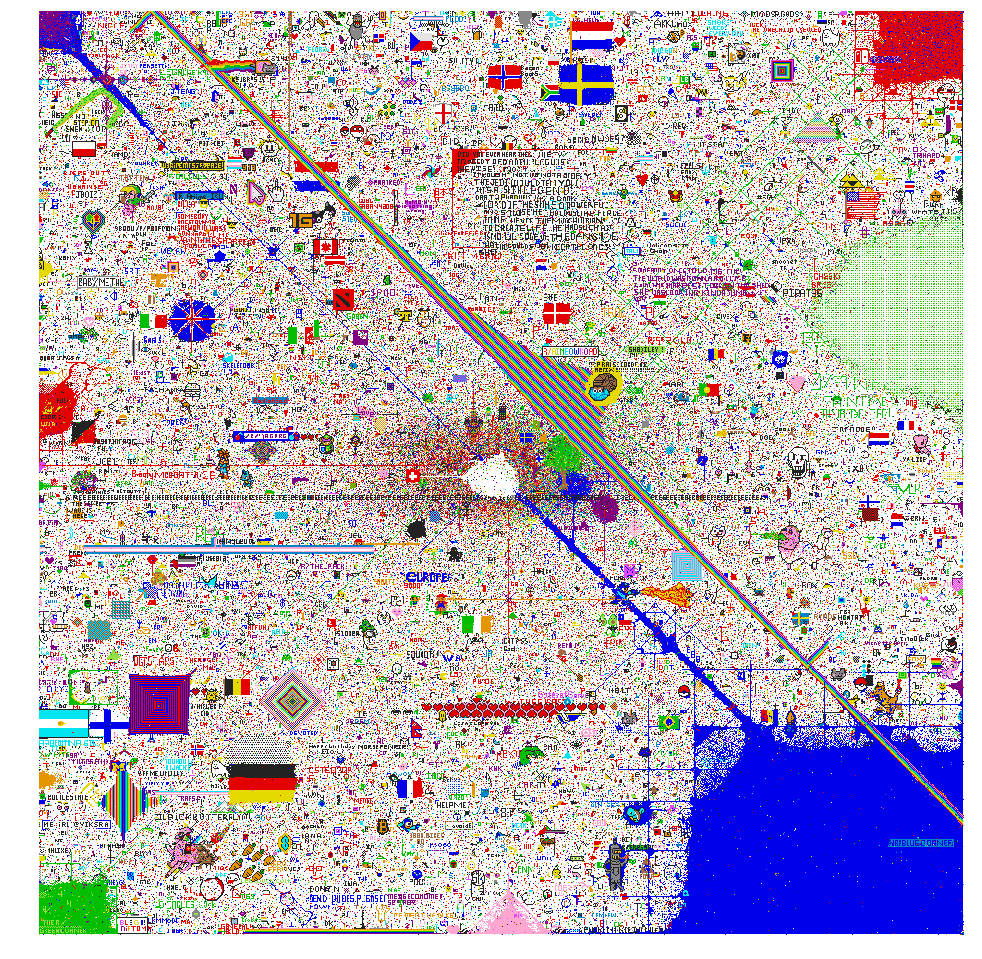

hour:  19
0 510 505 1
500000 950 842 13
1000000 754 713 6


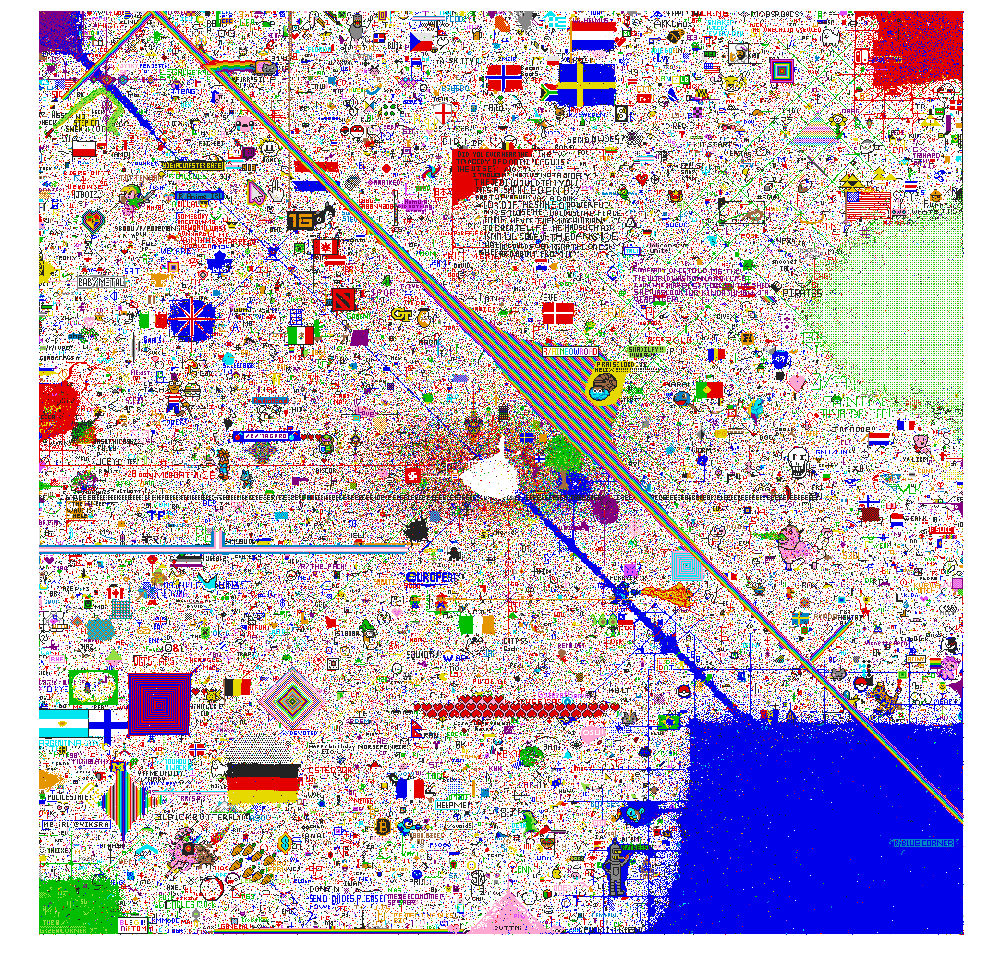

hour:  20
0 510 505 1
500000 950 842 13
1000000 754 713 6


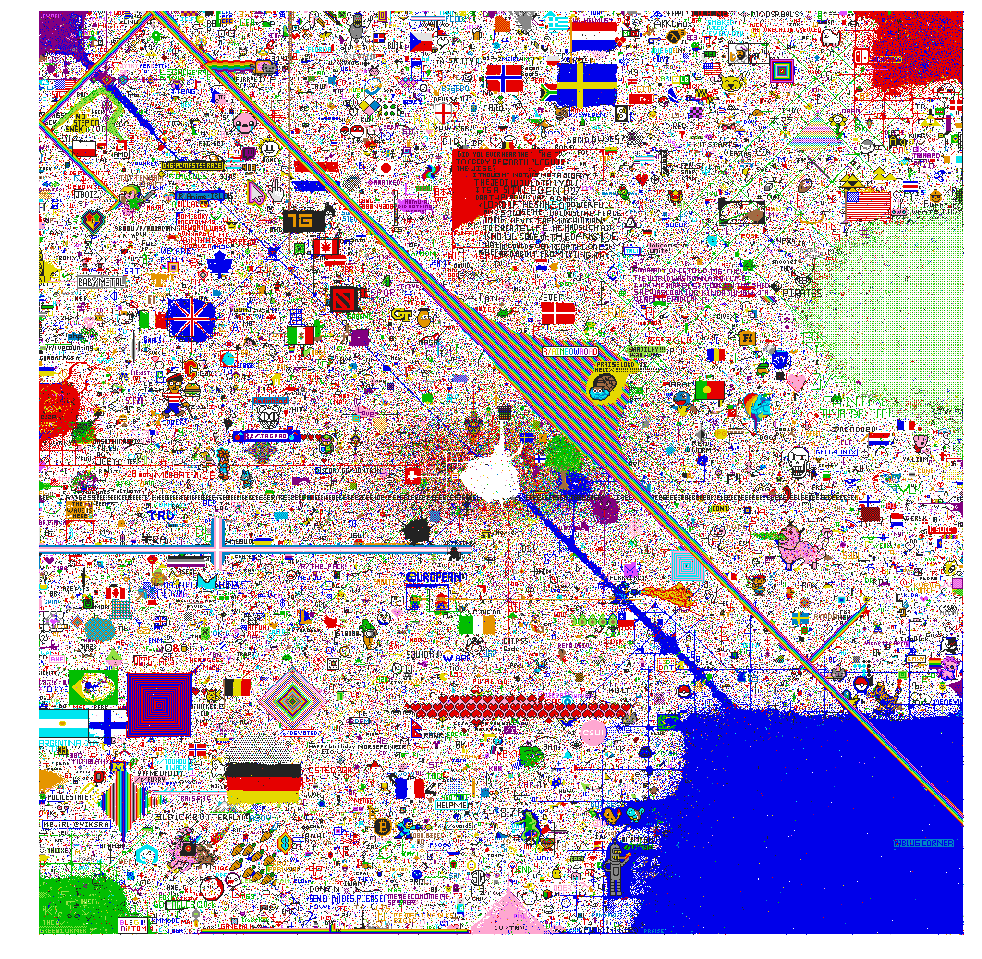

hour:  21
0 510 505 1
500000 950 842 13
1000000 754 713 6


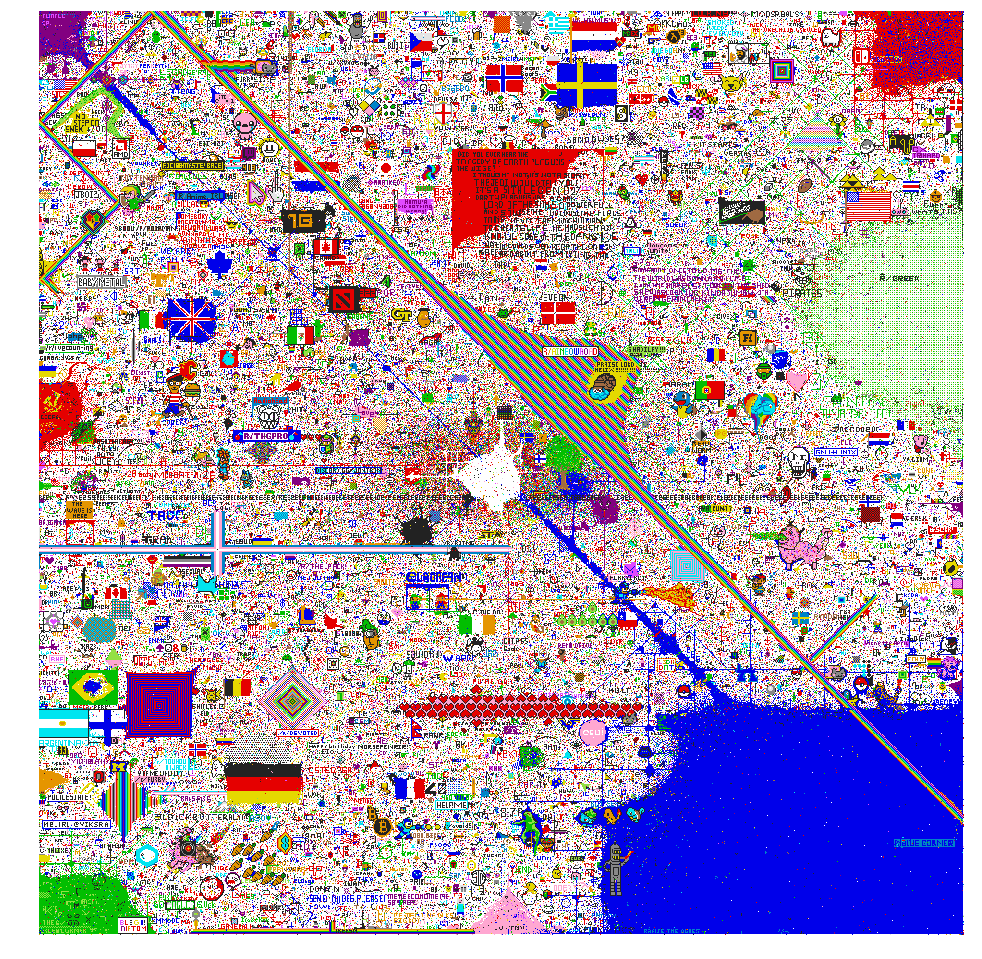

hour:  22
0 510 505 1
500000 950 842 13
1000000 754 713 6


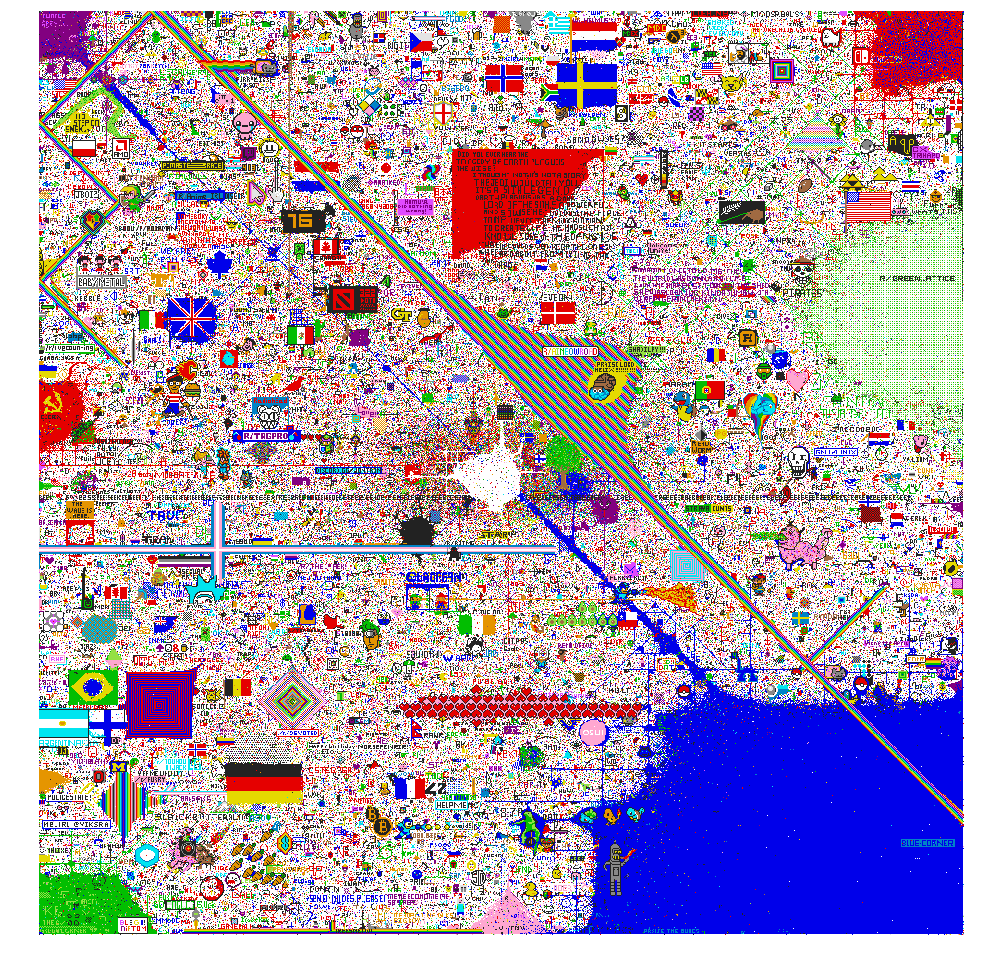

hour:  23
0 510 505 1
500000 950 842 13
1000000 754 713 6
1500000 457 51 5


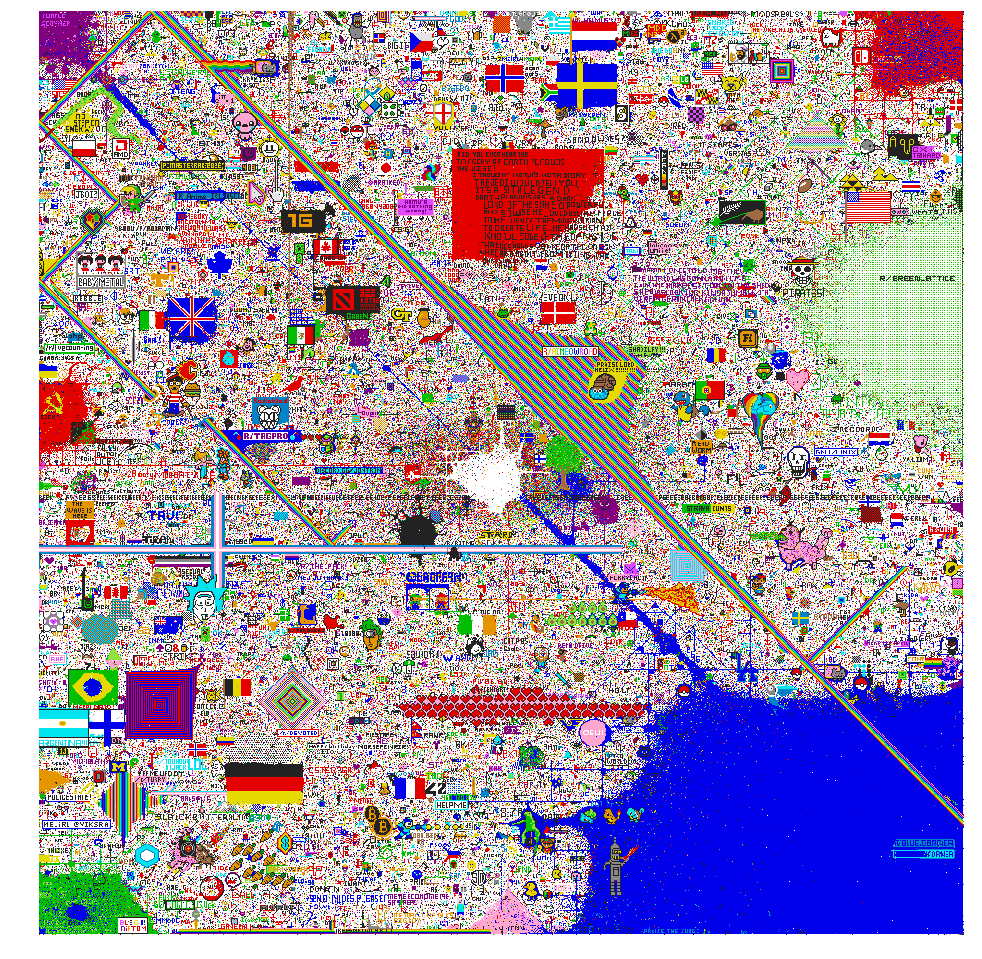

hour:  24
0 510 505 1
500000 950 842 13
1000000 754 713 6
1500000 457 51 5


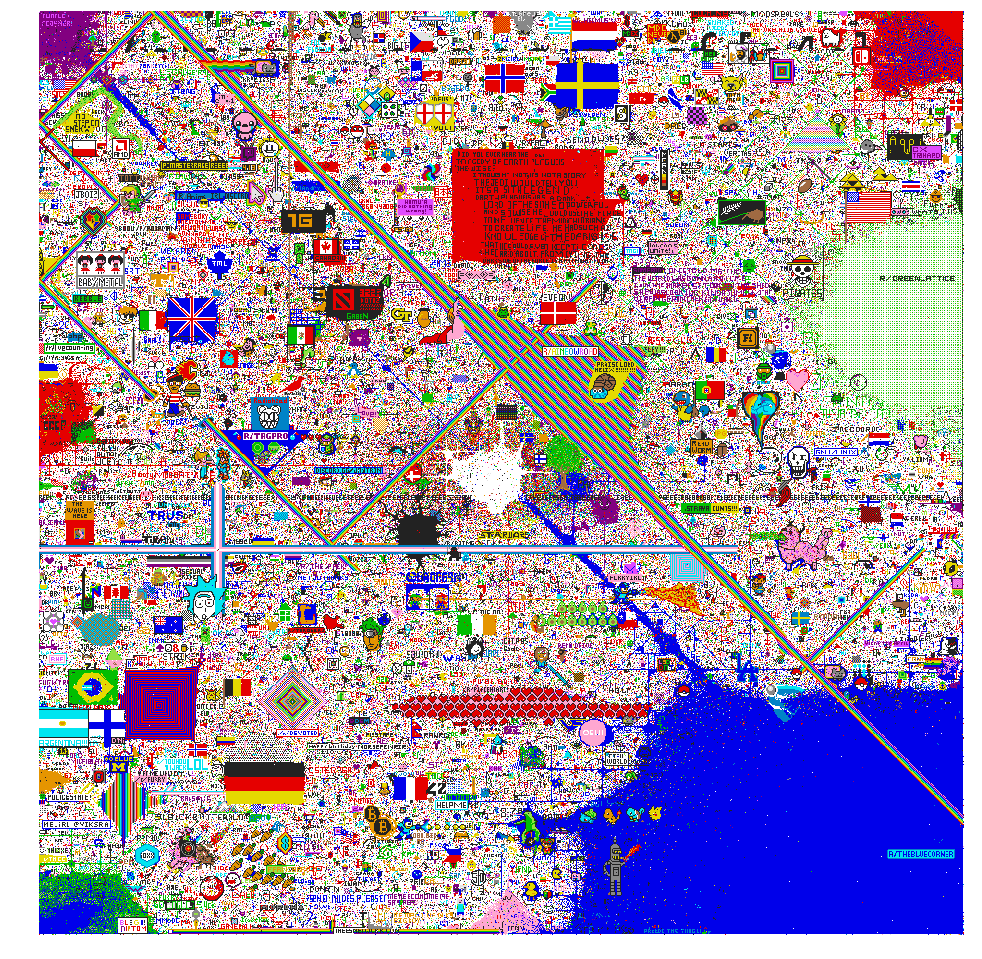

hour:  25
0 510 505 1
500000 950 842 13
1000000 754 713 6
1500000 457 51 5


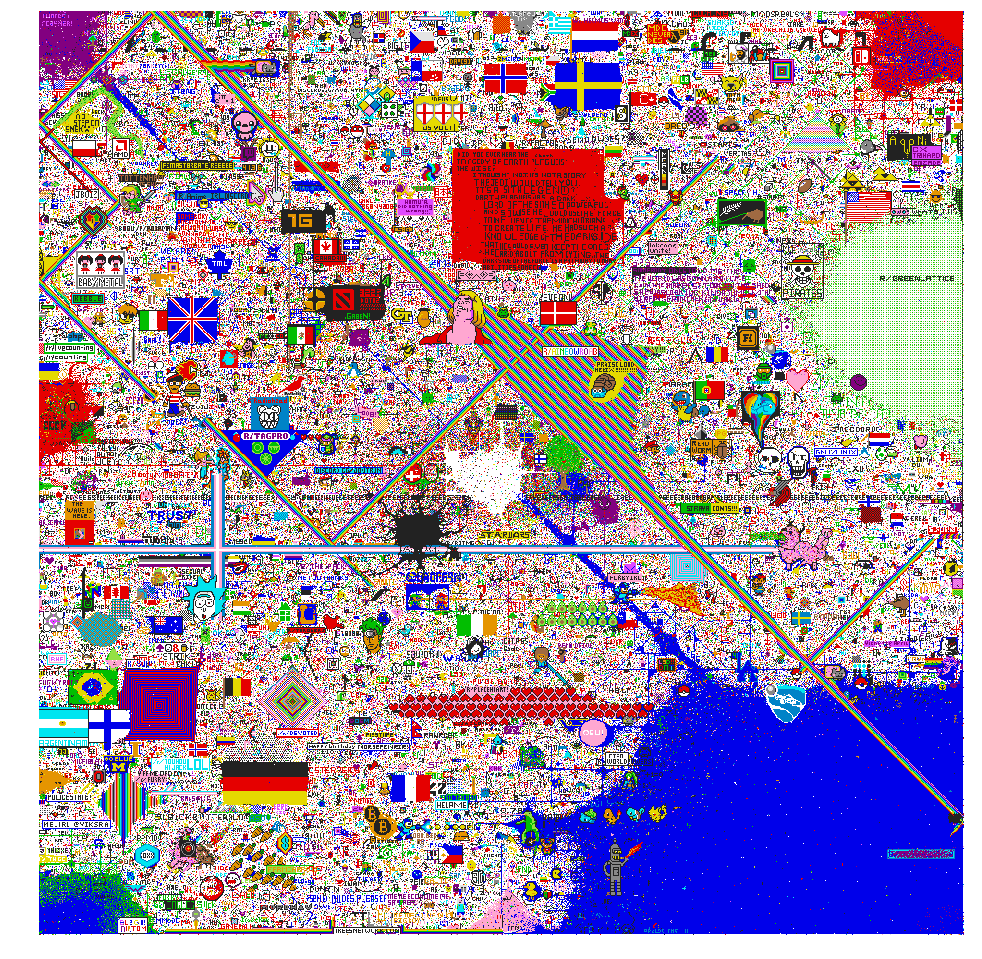

hour:  26
0 510 505 1
500000 950 842 13
1000000 754 713 6
1500000 457 51 5


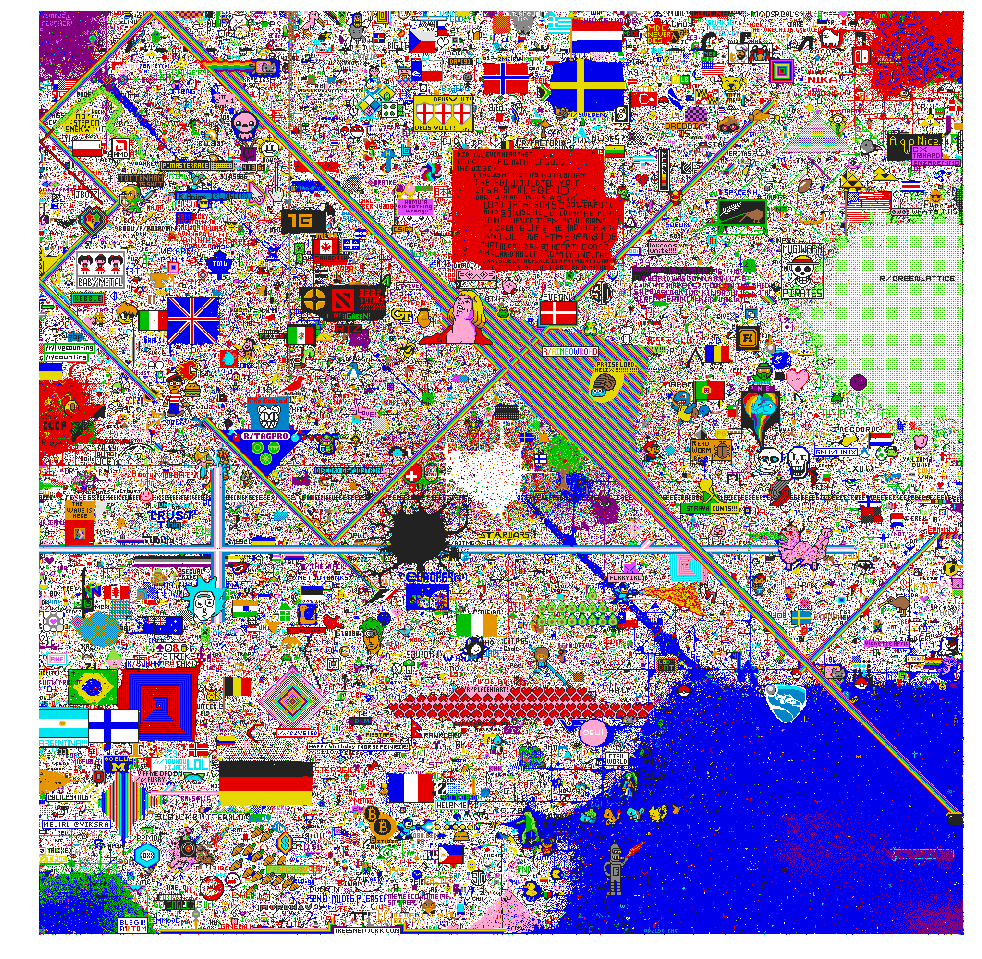

hour:  27
0 510 505 1
500000 950 842 13
1000000 754 713 6
1500000 457 51 5


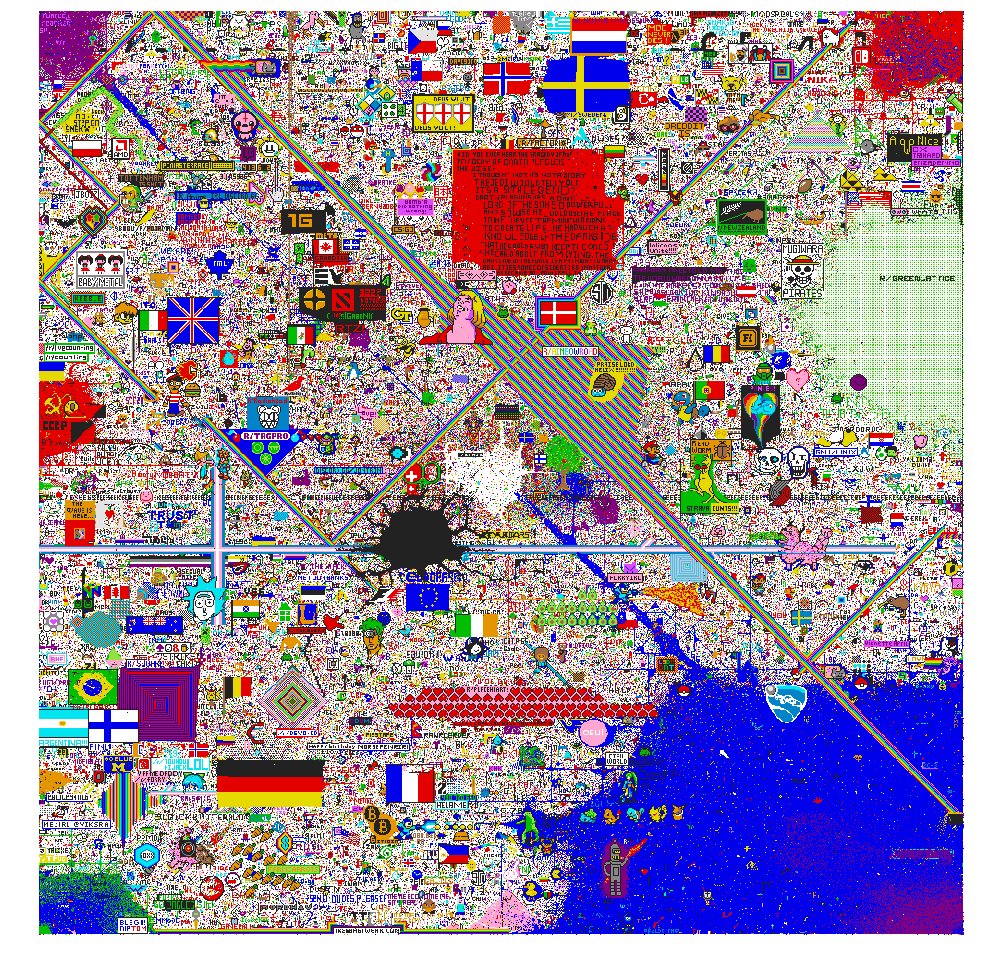

hour:  28
0 510 505 1
500000 950 842 13
1000000 754 713 6
1500000 457 51 5
2000000 330 521 12


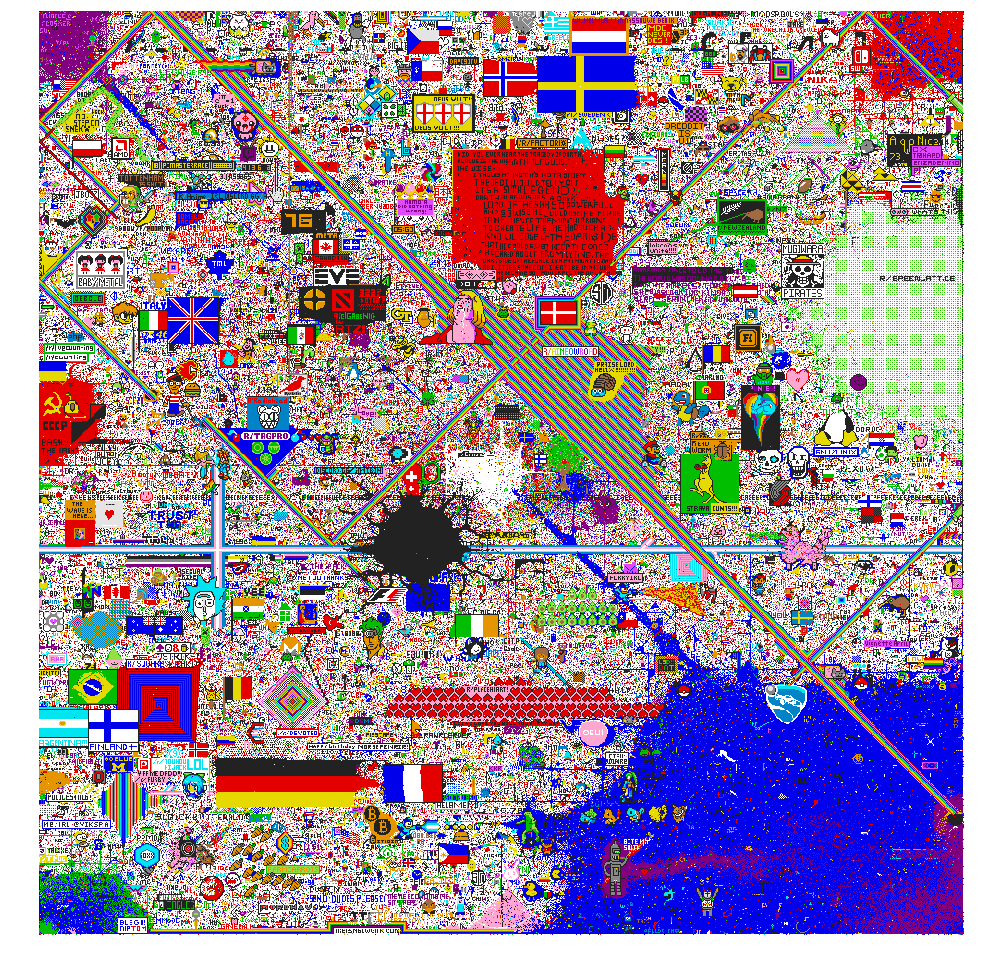

hour:  29
0 510 505 1
500000 950 842 13
1000000 754 713 6
1500000 457 51 5
2000000 330 521 12


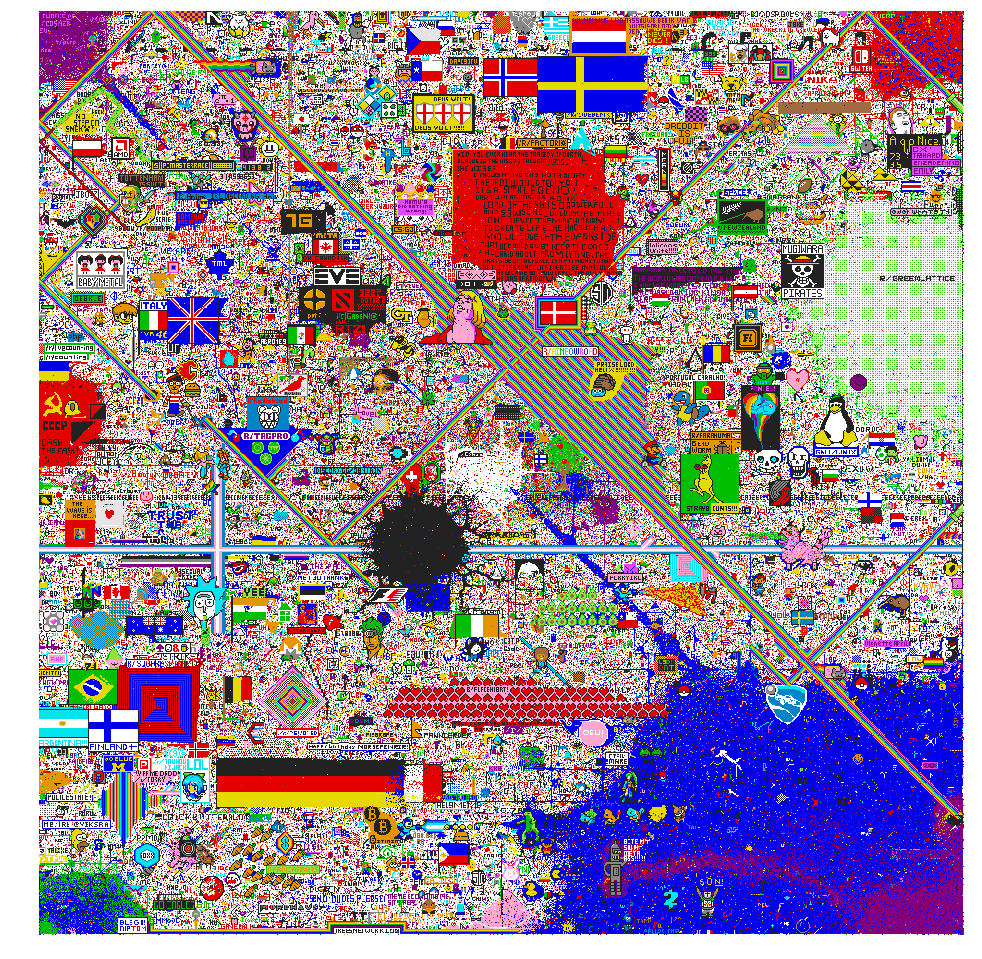

hour:  30
0 510 505 1
500000 950 842 13
1000000 754 713 6
1500000 457 51 5
2000000 330 521 12


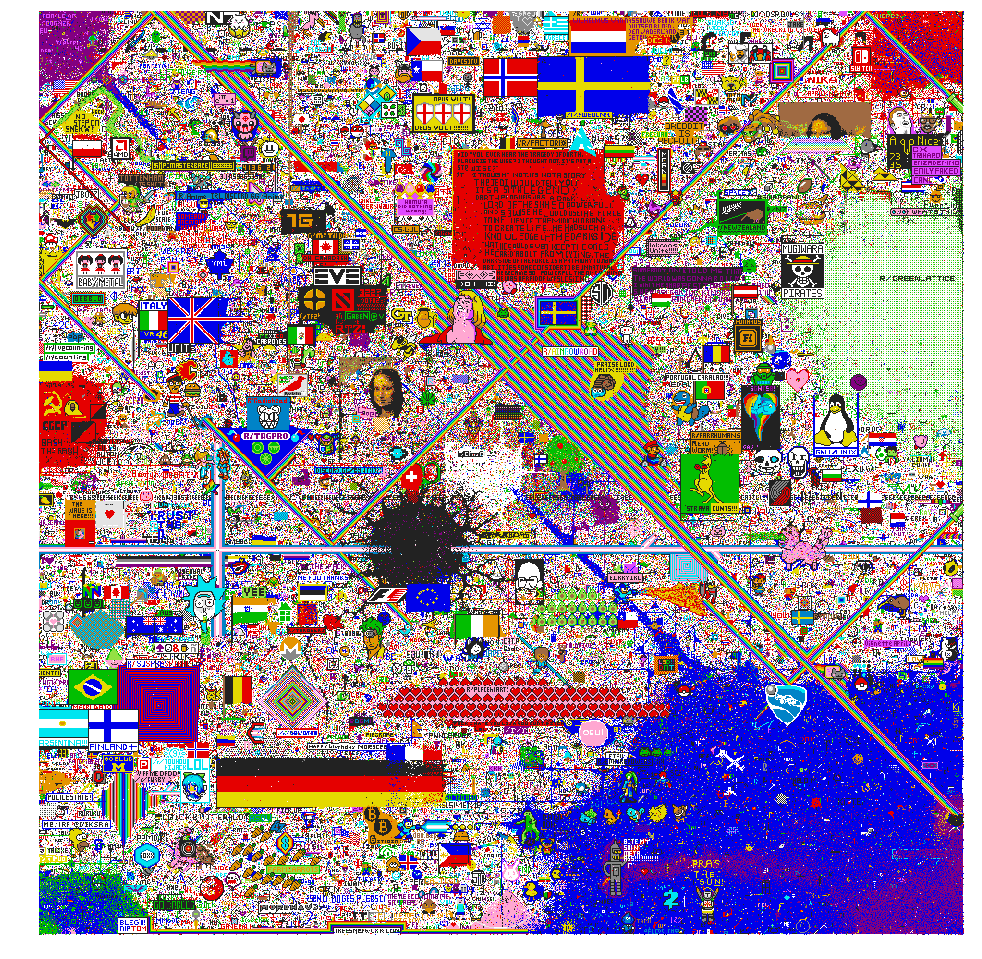

hour:  31
0 510 505 1
500000 950 842 13
1000000 754 713 6
1500000 457 51 5
2000000 330 521 12
2500000 635 229 6


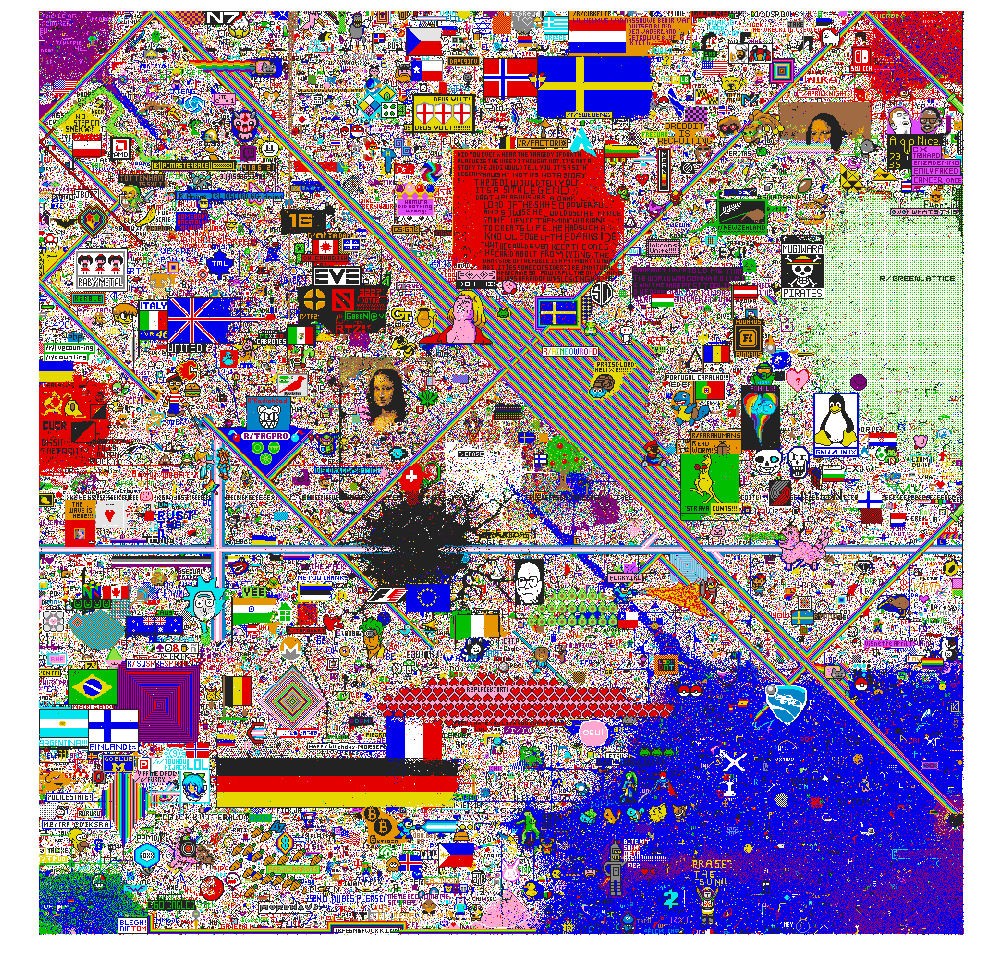

hour:  32
0 510 505 1
500000 950 842 13
1000000 754 713 6
1500000 457 51 5
2000000 330 521 12
2500000 635 229 6


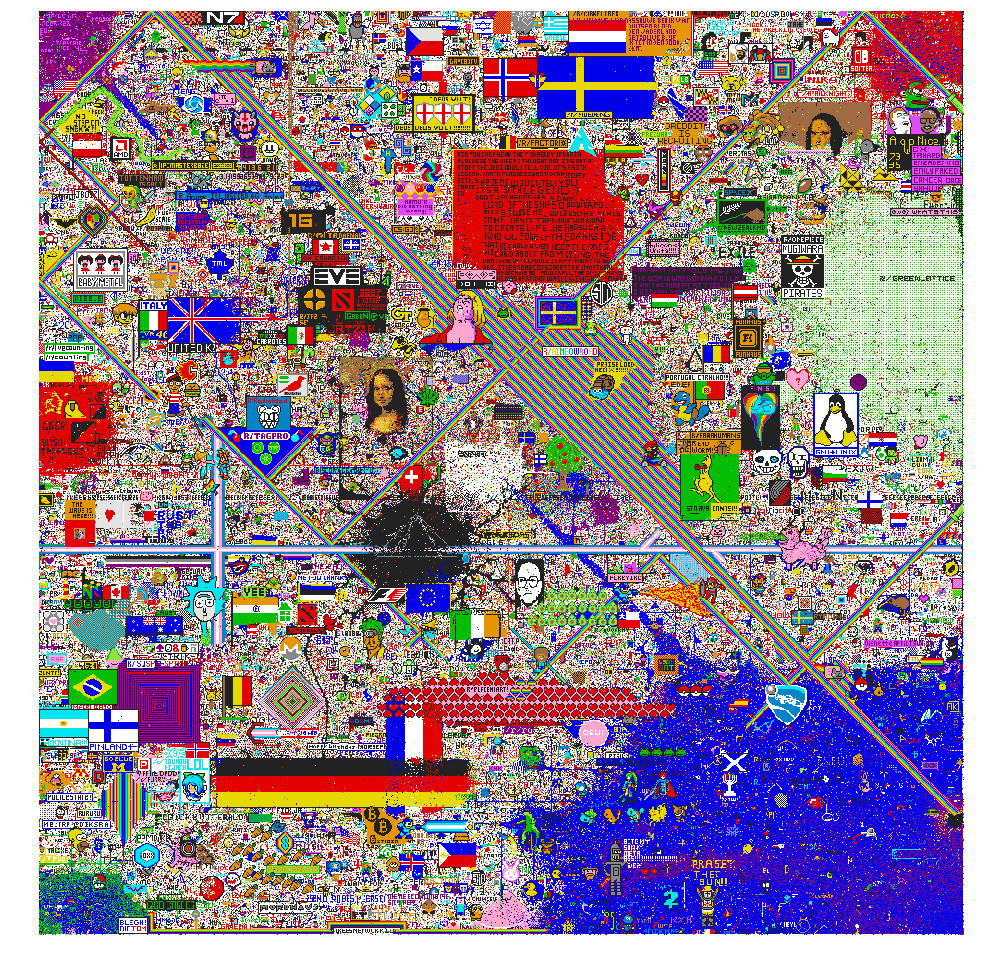

hour:  33
0 510 505 1
500000 950 842 13
1000000 754 713 6
1500000 457 51 5
2000000 330 521 12
2500000 635 229 6


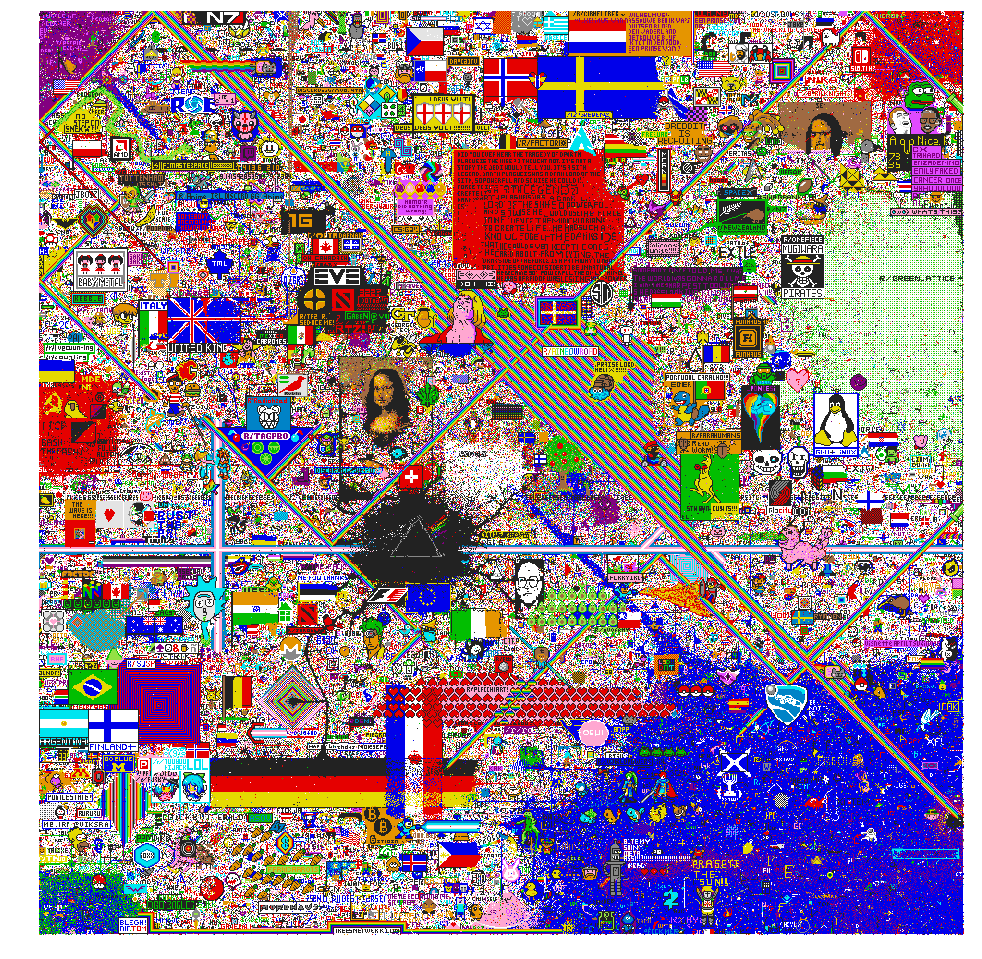

hour:  34
0 510 505 1
500000 950 842 13
1000000 754 713 6
1500000 457 51 5
2000000 330 521 12
2500000 635 229 6
3000000 837 346 5


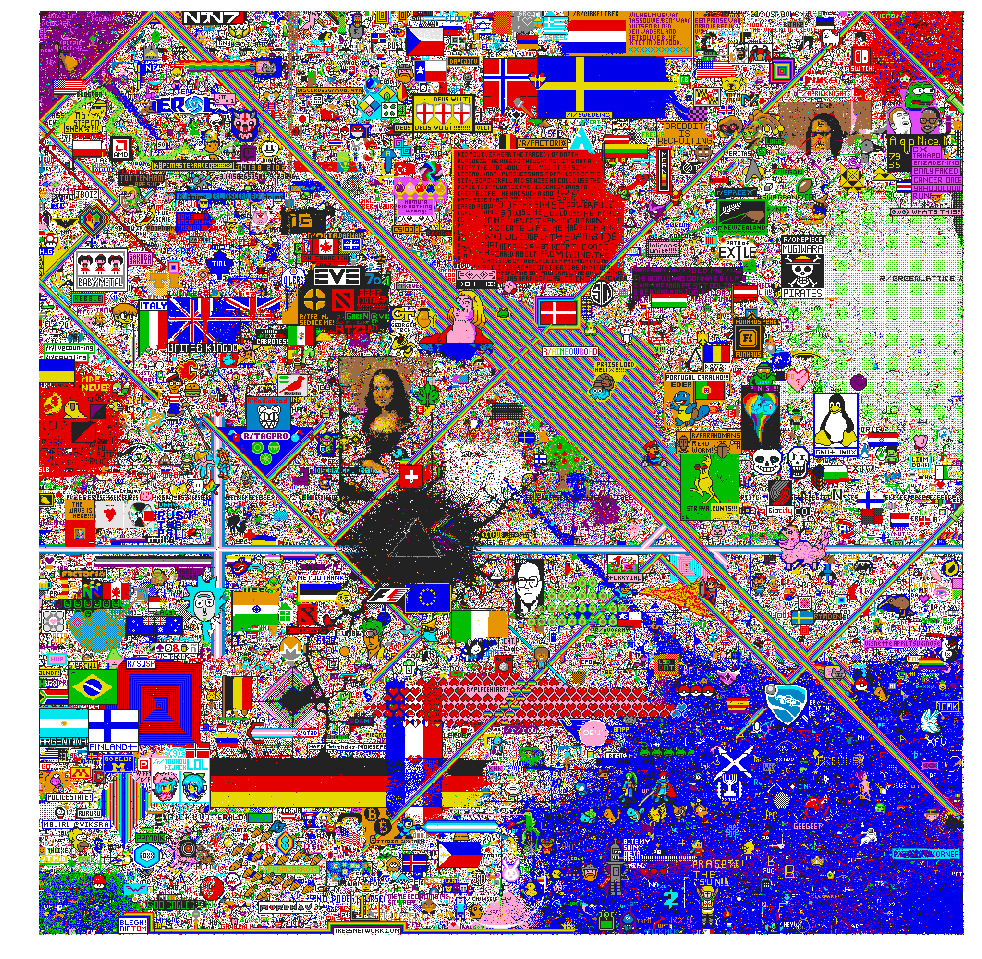

hour:  35
0 510 505 1
500000 950 842 13
1000000 754 713 6
1500000 457 51 5
2000000 330 521 12
2500000 635 229 6
3000000 837 346 5


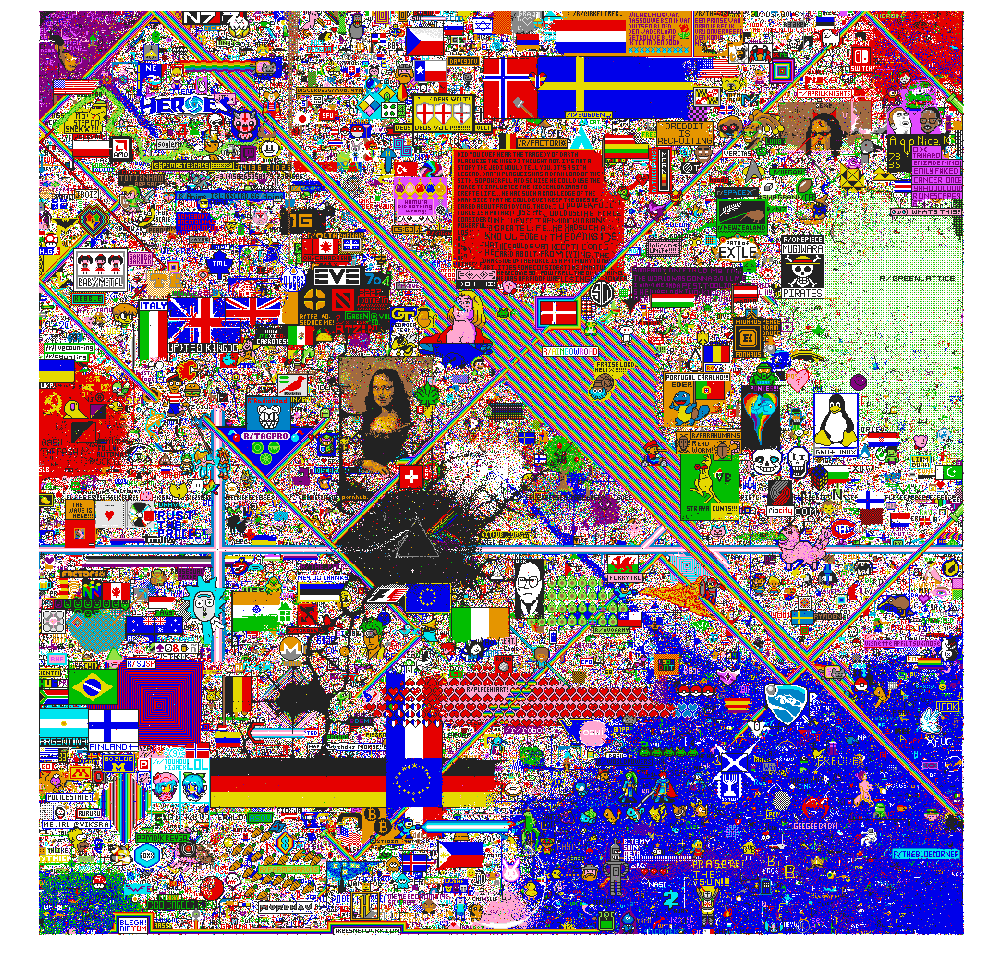

hour:  36
0 510 505 1
500000 950 842 13
1000000 754 713 6
1500000 457 51 5
2000000 330 521 12
2500000 635 229 6
3000000 837 346 5
3500000 391 616 8


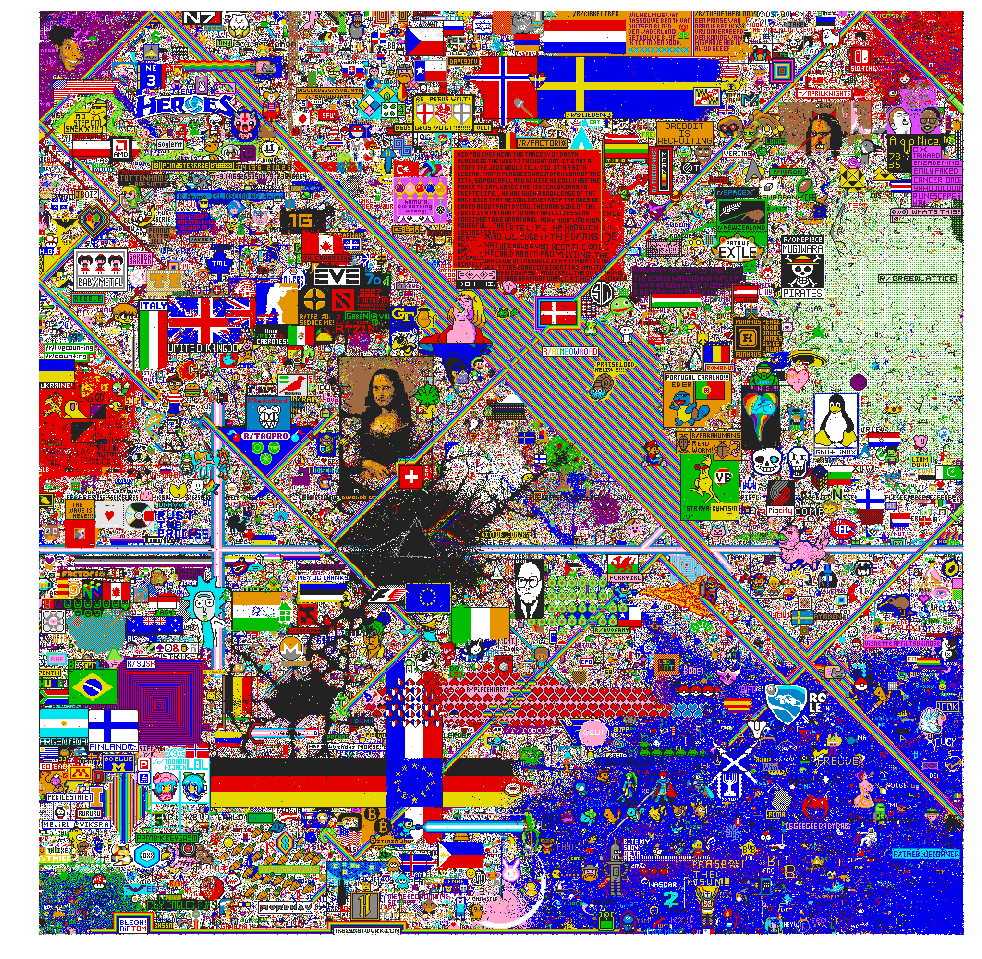

hour:  37
0 510 505 1
500000 950 842 13
1000000 754 713 6
1500000 457 51 5
2000000 330 521 12
2500000 635 229 6
3000000 837 346 5
3500000 391 616 8
4000000 483 860 2


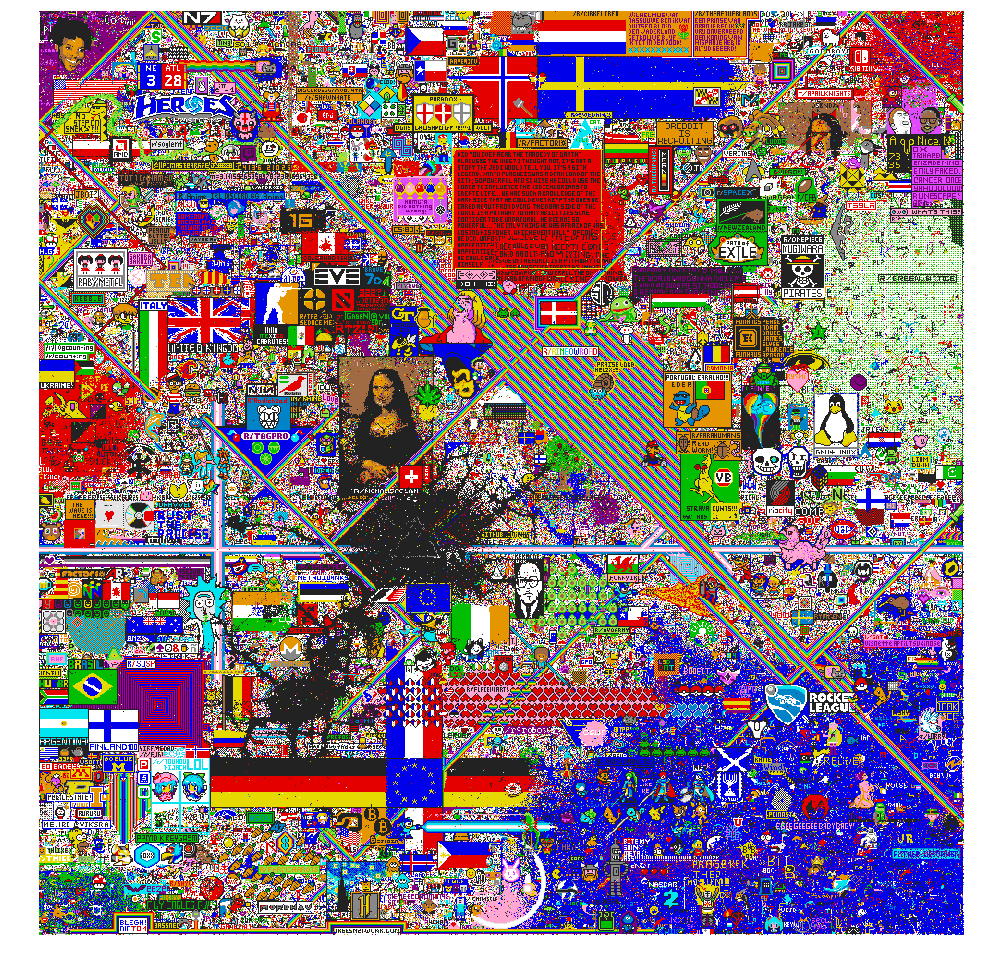

hour:  38
0 510 505 1
500000 950 842 13
1000000 754 713 6
1500000 457 51 5
2000000 330 521 12
2500000 635 229 6
3000000 837 346 5
3500000 391 616 8
4000000 483 860 2
4500000 421 8 3


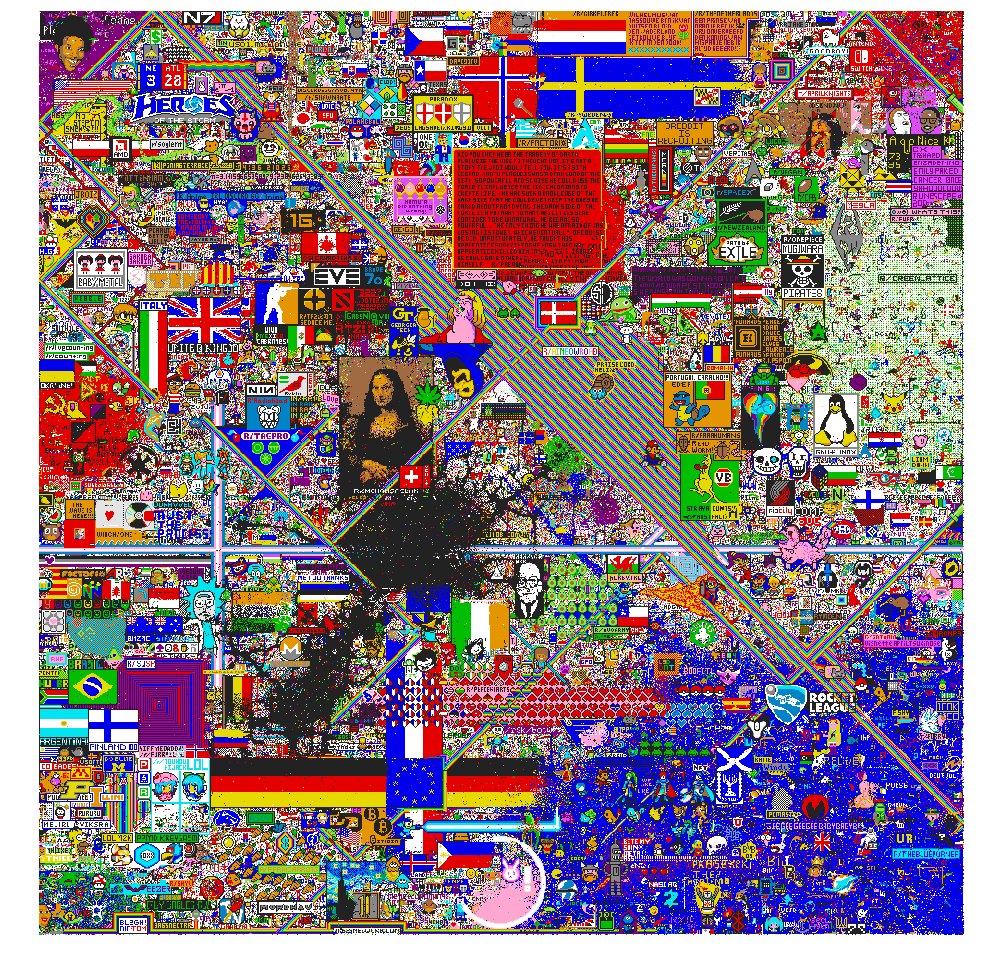

hour:  39
0 510 505 1
500000 950 842 13
1000000 754 713 6
1500000 457 51 5
2000000 330 521 12
2500000 635 229 6
3000000 837 346 5
3500000 391 616 8
4000000 483 860 2
4500000 421 8 3
5000000 8 183 1


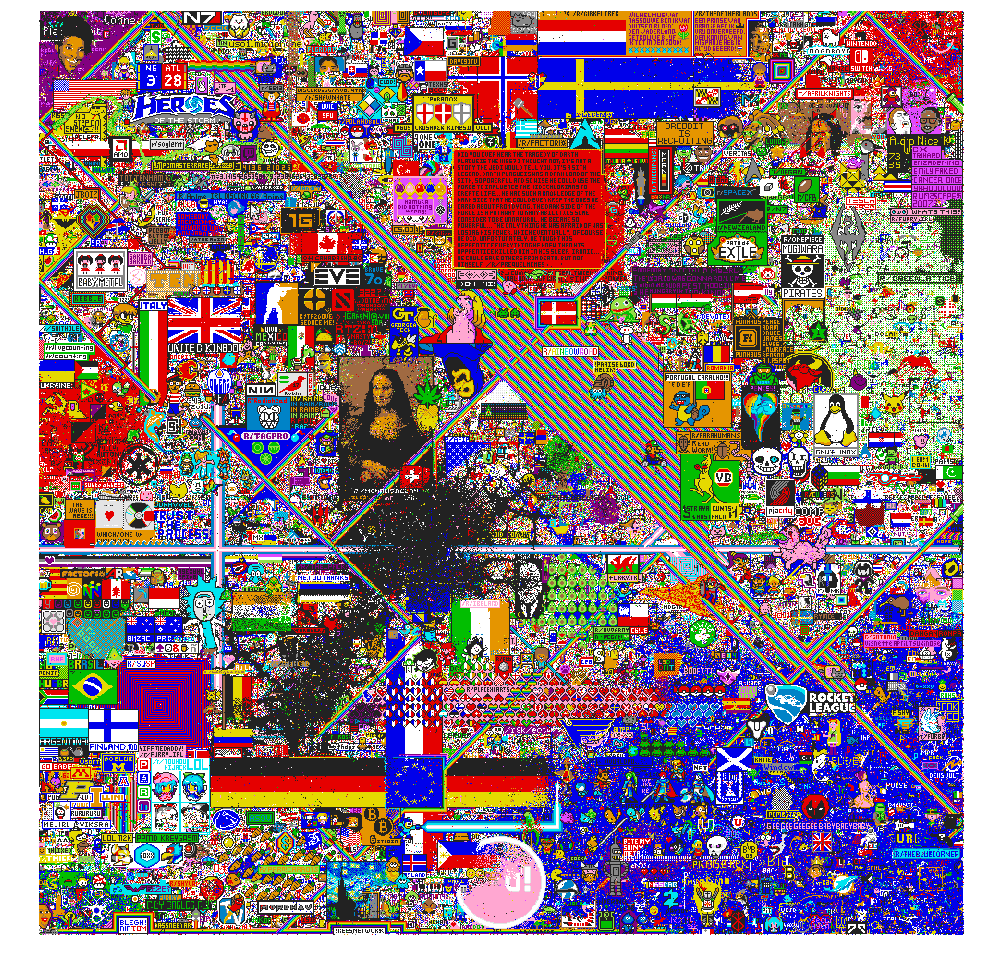

hour:  40
0 510 505 1
500000 950 842 13
1000000 754 713 6
1500000 457 51 5
2000000 330 521 12
2500000 635 229 6
3000000 837 346 5
3500000 391 616 8
4000000 483 860 2
4500000 421 8 3
5000000 8 183 1


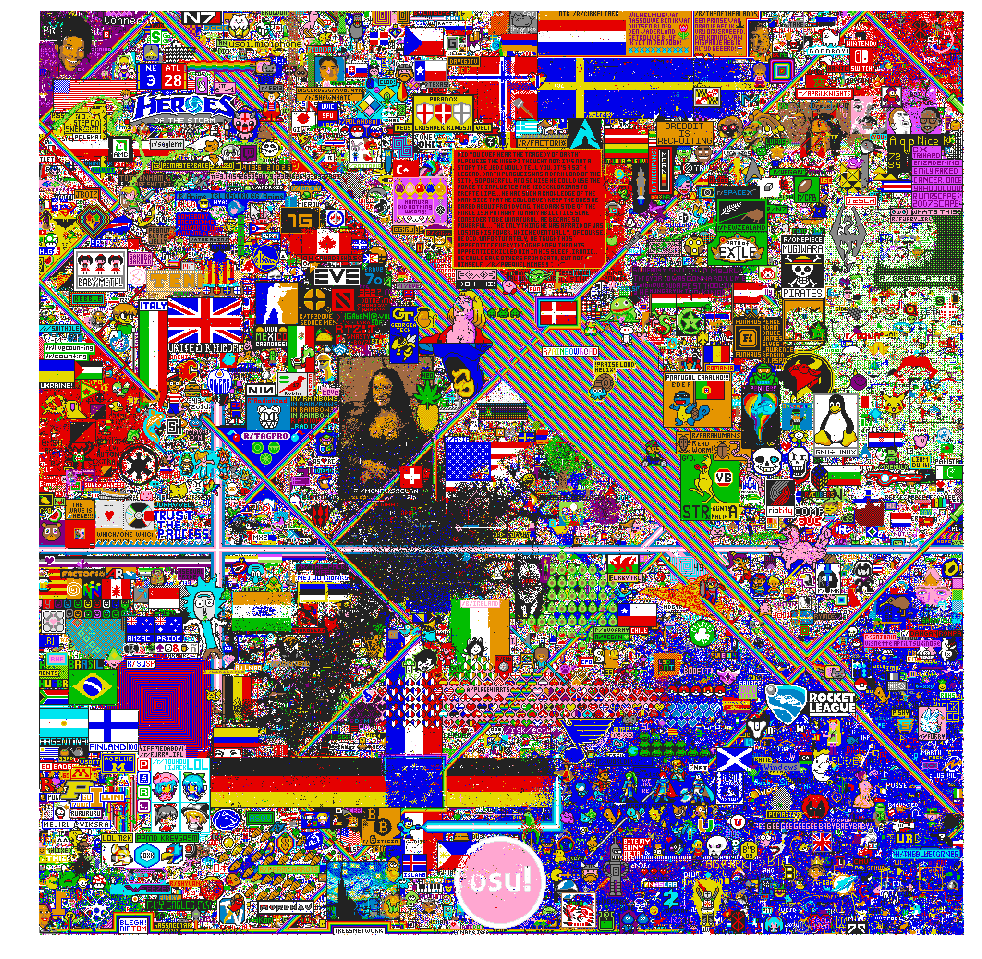

hour:  41
0 510 505 1
500000 950 842 13
1000000 754 713 6
1500000 457 51 5
2000000 330 521 12


KeyboardInterrupt: 

In [57]:
# Display the total canvas per hour (takes a too long time to fully display)
max_timepoint = 72
timepoints = create_timepoints(max_timepoint)

for hour, timepoint in enumerate(timepoints):
    print('hour: ', hour)
    timed_df = df[df['ts'] <= timepoint*time]
    display_on_canvas(timed_df)

In [38]:
def main():
    file_name = "image_coordinates.txt"
    images = read_image_coordinates(file_name)

    # event took place over the course of 72 hours
    max_timepoint = 72
    timepoints = create_timepoints(max_timepoint)
    ratios_list = []

    for image in images: 
        print(image[0])

        image_df = filter_image_from_df(image,df)
        image_users = obtain_users_from_df(image_df)
        image_users_df = gather_all_users_from_df(df, image_users)
        image_users_df = image_users_df.sort_values('ts').reset_index(drop=True)


        temp_image_df = image_df
        temp_image_users_df = image_users_df


        ratios = []

        # Doing it in reverse because that speeds up the process a bit (I think)
        for timepoint in reversed(timepoints):
            temp_image_df = temp_image_df[temp_image_df['ts'] <= timepoint*time]
            temp_image_users_df = temp_image_users_df[temp_image_users_df['ts'] <= timepoint*time]

            ratio = calculate_image_activity_ratio(image, temp_image_df, temp_image_users_df)
            ratios.append(ratio)
            print('hour: ', timepoint*max_timepoint)
            print('ratio: ', ratio)

        # Reverse the list back to sequential order
        print('reversed: ', ratios)
        ratios.reverse()
        print('not-reversed: ', ratios)
        ratios_list.append(ratios)

    # Just in case the data would take long to collect (it didn't)
#     write_list_of_lists_to_file("ratios_list.txt", ratios_list)


if __name__ == '__main__':
    main()

swiss_flag
hour:  72.0
ratio:  0.09128880882160655
hour:  71.0
ratio:  0.0920310079047002
hour:  70.0
ratio:  0.09278632633130227
hour:  69.0
ratio:  0.09338573236528343
hour:  68.0
ratio:  0.09398690828479708
hour:  67.0
ratio:  0.09453884530104043
hour:  66.0
ratio:  0.09540574796069808
hour:  65.0
ratio:  0.0962892551312236
hour:  64.0
ratio:  0.09737054102797825
hour:  63.0
ratio:  0.09851598949132581
hour:  62.0
ratio:  0.09955377706126209
hour:  61.0
ratio:  0.1004567281602098
hour:  60.0
ratio:  0.10173866123085225
hour:  59.0
ratio:  0.10329799438390586
hour:  58.0
ratio:  0.10494162196276428
hour:  57.0
ratio:  0.10643113729551576
hour:  56.0
ratio:  0.10799052904280508
hour:  55.0
ratio:  0.10967227566635408
hour:  54.0
ratio:  0.11209192155478072
hour:  53.0
ratio:  0.11457506416234421
hour:  52.0
ratio:  0.11670947211991987
hour:  51.0
ratio:  0.1184706196422745
hour:  50.0
ratio:  0.11831171080741369
hour:  49.0
ratio:  0.11866525894643254
hour:  48.0
ratio:  0.11817643405

hour:  72.0
ratio:  0.11504988428401952
hour:  71.0
ratio:  0.11523062497209281
hour:  70.0
ratio:  0.11648171481487105
hour:  69.0
ratio:  0.11782296650717704
hour:  68.0
ratio:  0.11918468877425178
hour:  67.0
ratio:  0.12029426794991908
hour:  66.0
ratio:  0.12131009731966763
hour:  65.0
ratio:  0.12240136922087408
hour:  64.0
ratio:  0.12346791039002664
hour:  63.0
ratio:  0.12499648823136093
hour:  62.0
ratio:  0.12657342657342657
hour:  61.0
ratio:  0.1278777178854016
hour:  60.0
ratio:  0.12973655719956695
hour:  59.0
ratio:  0.13194182151415143
hour:  58.0
ratio:  0.1328890906881711
hour:  57.0
ratio:  0.12846123154674824
hour:  56.0
ratio:  0.12425707211861879
hour:  55.0
ratio:  0.12257695868533734
hour:  54.0
ratio:  0.12382407211349405
hour:  53.0
ratio:  0.12525840710757627
hour:  52.0
ratio:  0.1271102936346318
hour:  51.0
ratio:  0.1283542382564356
hour:  50.0
ratio:  0.1292083712465878
hour:  49.0
ratio:  0.13139543352390662
hour:  48.0
ratio:  0.13337260732553463
hour:

hour:  72.0
ratio:  0.12094935903748934
hour:  71.0
ratio:  0.12116605168372216
hour:  70.0
ratio:  0.1217522485309562
hour:  69.0
ratio:  0.1231879766209637
hour:  68.0
ratio:  0.12454174262247664
hour:  67.0
ratio:  0.12609708882223258
hour:  66.0
ratio:  0.1274068893936291
hour:  65.0
ratio:  0.12847883044098796
hour:  64.0
ratio:  0.12960865139979597
hour:  63.0
ratio:  0.1306909607481364
hour:  62.0
ratio:  0.13177913078745493
hour:  61.0
ratio:  0.13308602529040645
hour:  60.0
ratio:  0.1345516371386243
hour:  59.0
ratio:  0.13616462317903535
hour:  58.0
ratio:  0.1377961843889343
hour:  57.0
ratio:  0.1387827523333905
hour:  56.0
ratio:  0.13905337079879213
hour:  55.0
ratio:  0.14001149569672677
hour:  54.0
ratio:  0.1420825824021787
hour:  53.0
ratio:  0.14168531387664735
hour:  52.0
ratio:  0.14175334323922734
hour:  51.0
ratio:  0.1413237605372196
hour:  50.0
ratio:  0.13868100029132574
hour:  49.0
ratio:  0.13609523899373047
hour:  48.0
ratio:  0.13659664254626752
hour:  47

hour:  72.0
ratio:  0.09436150105635731
hour:  71.0
ratio:  0.09516629543368117
hour:  70.0
ratio:  0.09609661725973505
hour:  69.0
ratio:  0.09694702044057169
hour:  68.0
ratio:  0.09780216435948855
hour:  67.0
ratio:  0.0986962951457742
hour:  66.0
ratio:  0.09933112980247667
hour:  65.0
ratio:  0.0999941789078819
hour:  64.0
ratio:  0.10076921439026418
hour:  63.0
ratio:  0.1010741027482832
hour:  62.0
ratio:  0.1015252747284087
hour:  61.0
ratio:  0.10189659739060071
hour:  60.0
ratio:  0.10220122485214199
hour:  59.0
ratio:  0.10232187333507059
hour:  58.0
ratio:  0.10155739363970262
hour:  57.0
ratio:  0.09883219668476807
hour:  56.0
ratio:  0.09161877478295806
hour:  55.0
ratio:  0.08281284504968715
hour:  54.0
ratio:  0.07243695462839878
hour:  53.0
ratio:  0.07010723943412508
hour:  52.0
ratio:  0.06767594179199249
hour:  51.0
ratio:  0.06508769651409085
hour:  50.0
ratio:  0.06436223351632364
hour:  49.0
ratio:  0.0643254312182544
hour:  48.0
ratio:  0.06431271966816637
hour:

hour:  72.0
ratio:  0.12726630817002393
hour:  71.0
ratio:  0.12719499972212162
hour:  70.0
ratio:  0.127016935428203
hour:  69.0
ratio:  0.12685042815175948
hour:  68.0
ratio:  0.12707405825957913
hour:  67.0
ratio:  0.12800066864664983
hour:  66.0
ratio:  0.12889242895157446
hour:  65.0
ratio:  0.12965219385782897
hour:  64.0
ratio:  0.13047859352550226
hour:  63.0
ratio:  0.1311969817856255
hour:  62.0
ratio:  0.1318629179369213
hour:  61.0
ratio:  0.132301492095357
hour:  60.0
ratio:  0.13283886532943018
hour:  59.0
ratio:  0.1335573144895661
hour:  58.0
ratio:  0.13414986564546494
hour:  57.0
ratio:  0.1349436685478328
hour:  56.0
ratio:  0.13589467960689805
hour:  55.0
ratio:  0.136972728096403
hour:  54.0
ratio:  0.13813706155476294
hour:  53.0
ratio:  0.13921240528232284
hour:  52.0
ratio:  0.1403771969195392
hour:  51.0
ratio:  0.14172734779348012
hour:  50.0
ratio:  0.14312470218858425
hour:  49.0
ratio:  0.14458658715465744
hour:  48.0
ratio:  0.14630430495093655
hour:  47.0

hour:  72.0
ratio:  0.09765179335781549
hour:  71.0
ratio:  0.09786122672561784
hour:  70.0
ratio:  0.0982400718270166
hour:  69.0
ratio:  0.09862337847421337
hour:  68.0
ratio:  0.09915477958401117
hour:  67.0
ratio:  0.09968423660641332
hour:  66.0
ratio:  0.10016250948862968
hour:  65.0
ratio:  0.10038971386655056
hour:  64.0
ratio:  0.10076949045567632
hour:  63.0
ratio:  0.10094201084377417
hour:  62.0
ratio:  0.10040928007214947
hour:  61.0
ratio:  0.09958643052445006
hour:  60.0
ratio:  0.09915386810380243
hour:  59.0
ratio:  0.09817398891462503
hour:  58.0
ratio:  0.09696718770660777
hour:  57.0
ratio:  0.09626590624753446
hour:  56.0
ratio:  0.09576962187405845
hour:  55.0
ratio:  0.09452649442319754
hour:  54.0
ratio:  0.09315704611415672
hour:  53.0
ratio:  0.09063872509356403
hour:  52.0
ratio:  0.08657227781181222
hour:  51.0
ratio:  0.08291331169120464
hour:  50.0
ratio:  0.08096722372001028
hour:  49.0
ratio:  0.07954549105149367
hour:  48.0
ratio:  0.07818954658903213
h

hour:  72.0
ratio:  0.0926274673920625
hour:  71.0
ratio:  0.09334748761500354
hour:  70.0
ratio:  0.09410582719357
hour:  69.0
ratio:  0.09502218558300803
hour:  68.0
ratio:  0.09596282454760031
hour:  67.0
ratio:  0.09697889707346208
hour:  66.0
ratio:  0.09783211494832367
hour:  65.0
ratio:  0.09875787486928354
hour:  64.0
ratio:  0.10010090295205816
hour:  63.0
ratio:  0.10144125629067531
hour:  62.0
ratio:  0.10213086526043909
hour:  61.0
ratio:  0.10332225000686983
hour:  60.0
ratio:  0.10553428667942799
hour:  59.0
ratio:  0.10746449601662626
hour:  58.0
ratio:  0.10938334619265239
hour:  57.0
ratio:  0.11170017161068889
hour:  56.0
ratio:  0.11375158428390368
hour:  55.0
ratio:  0.115824298208261
hour:  54.0
ratio:  0.11843267858356556
hour:  53.0
ratio:  0.11962298915739494
hour:  52.0
ratio:  0.11770352593686542
hour:  51.0
ratio:  0.12114689830117611
hour:  50.0
ratio:  0.12429783673957213
hour:  49.0
ratio:  0.1272757296784048
hour:  48.0
ratio:  0.13072759046928945
hour:  

hour:  72.0
ratio:  0.15531913386886229
hour:  71.0
ratio:  0.15528246992921968
hour:  70.0
ratio:  0.15455940230805149
hour:  69.0
ratio:  0.1537315814670993
hour:  68.0
ratio:  0.15284277115004077
hour:  67.0
ratio:  0.15283204684588766
hour:  66.0
ratio:  0.15307480264608
hour:  65.0
ratio:  0.15277118335818388
hour:  64.0
ratio:  0.15229823169349355
hour:  63.0
ratio:  0.15100132236474698
hour:  62.0
ratio:  0.14887610525194417
hour:  61.0
ratio:  0.14699340622045526
hour:  60.0
ratio:  0.14532846147865972
hour:  59.0
ratio:  0.14296048525198854
hour:  58.0
ratio:  0.1402739617326443
hour:  57.0
ratio:  0.13815834696655163
hour:  56.0
ratio:  0.13406972432142458
hour:  55.0
ratio:  0.1296161404626953
hour:  54.0
ratio:  0.12462516782030565
hour:  53.0
ratio:  0.11883967826590777
hour:  52.0
ratio:  0.11315973712143454
hour:  51.0
ratio:  0.1066870337546054
hour:  50.0
ratio:  0.10099194902923773
hour:  49.0
ratio:  0.09411160098455547
hour:  48.0
ratio:  0.0841552327917791
hour:  4

hour:  72.0
ratio:  0.06243357726292776
hour:  71.0
ratio:  0.06288524590163934
hour:  70.0
ratio:  0.06284822295705922
hour:  69.0
ratio:  0.06280321178779087
hour:  68.0
ratio:  0.06255462860753988
hour:  67.0
ratio:  0.06264880827184695
hour:  66.0
ratio:  0.061773824606616706
hour:  65.0
ratio:  0.05490449344976207
hour:  64.0
ratio:  0.053192825738013816
hour:  63.0
ratio:  0.05378286557637847
hour:  62.0
ratio:  0.05416024539514823
hour:  61.0
ratio:  0.05364312079688527
hour:  60.0
ratio:  0.052911592335508545
hour:  59.0
ratio:  0.051602157275448944
hour:  58.0
ratio:  0.050648231042143305
hour:  57.0
ratio:  0.04998969756633623
hour:  56.0
ratio:  0.048526759943105735
hour:  55.0
ratio:  0.04739206900623318
hour:  54.0
ratio:  0.046722468278279645
hour:  53.0
ratio:  0.04568624519145813
hour:  52.0
ratio:  0.04456477058498349
hour:  51.0
ratio:  0.044376773888363294
hour:  50.0
ratio:  0.04477944681047339
hour:  49.0
ratio:  0.04517270510225226
hour:  48.0
ratio:  0.0458349874

hour:  72.0
ratio:  0.1396062283841023
hour:  71.0
ratio:  0.1390663994140325
hour:  70.0
ratio:  0.13847510846072184
hour:  69.0
ratio:  0.13810391768859587
hour:  68.0
ratio:  0.13841591533558675
hour:  67.0
ratio:  0.1389695539184131
hour:  66.0
ratio:  0.13952513932653393
hour:  65.0
ratio:  0.13928961265008702
hour:  64.0
ratio:  0.13986202489941396
hour:  63.0
ratio:  0.14085447432489726
hour:  62.0
ratio:  0.1417733768367561
hour:  61.0
ratio:  0.1427211650577849
hour:  60.0
ratio:  0.14328249641047355
hour:  59.0
ratio:  0.14394311484193606
hour:  58.0
ratio:  0.14481113777100904
hour:  57.0
ratio:  0.1454178823487424
hour:  56.0
ratio:  0.14487790212954554
hour:  55.0
ratio:  0.1435186386157877
hour:  54.0
ratio:  0.14250644450893696
hour:  53.0
ratio:  0.13829262230419262
hour:  52.0
ratio:  0.1348170673762235
hour:  51.0
ratio:  0.13095897226033718
hour:  50.0
ratio:  0.1277934347680958
hour:  49.0
ratio:  0.12462158095069488
hour:  48.0
ratio:  0.12138322026922668
hour:  47

['swiss_flag', 'link', 'radiohead', 'european_flag', 'german_flag', 'french_flag', 'van_gogh', 'dutch_flag', 'star_wars', 'tom_searle', 'praise_sun', 'new_zealand', 'rocinante', 'canada_flag', 'greek_turkish_flag', 'squidward', 'euler', 'berserk', 'poland_flag', 'linux']


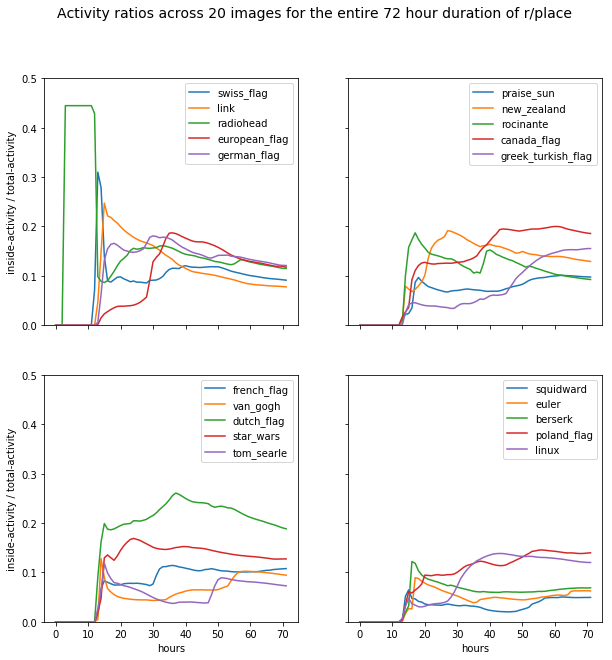

In [122]:
# Plot the results

image_names = []
for image in images:
    image_names.append(image[0])
print(image_names)

fig, axs = plt.subplots(2, 2, figsize=(10,10))
fig.suptitle("Activity ratios across 20 images for the entire 72 hour duration of r/place", fontsize=14)
for i in range(0,5):
    lst = ratios_list[i]
    axs[0,0].plot(lst)
    axs[0,0].legend(image_names[0:5])
    axs[0,0].set_ylim([0, 0.5])
    
for i in range(5,10):
    lst = ratios_list[i]
    axs[1,0].plot(lst)
    axs[1,0].legend(image_names[5:10])
    axs[1,0].set_ylim([0, 0.5])
    
for i in range(10,15):
    lst = ratios_list[i]
    axs[0,1].plot(lst)
    axs[0,1].legend(image_names[10:15])
    axs[0,1].set_ylim([0, 0.5])
    
for i in range(15,20):
    lst = ratios_list[i]
    axs[1,1].plot(lst)
    axs[1,1].legend(image_names[15:20])
    axs[1,1].set_ylim([0, 0.5])

for ax in axs.flat:
    ax.set(xlabel='hours', ylabel='inside-activity / total-activity')
    ax.label_outer()
fig.savefig('results.png')

hour:  0
european_flag
image activity


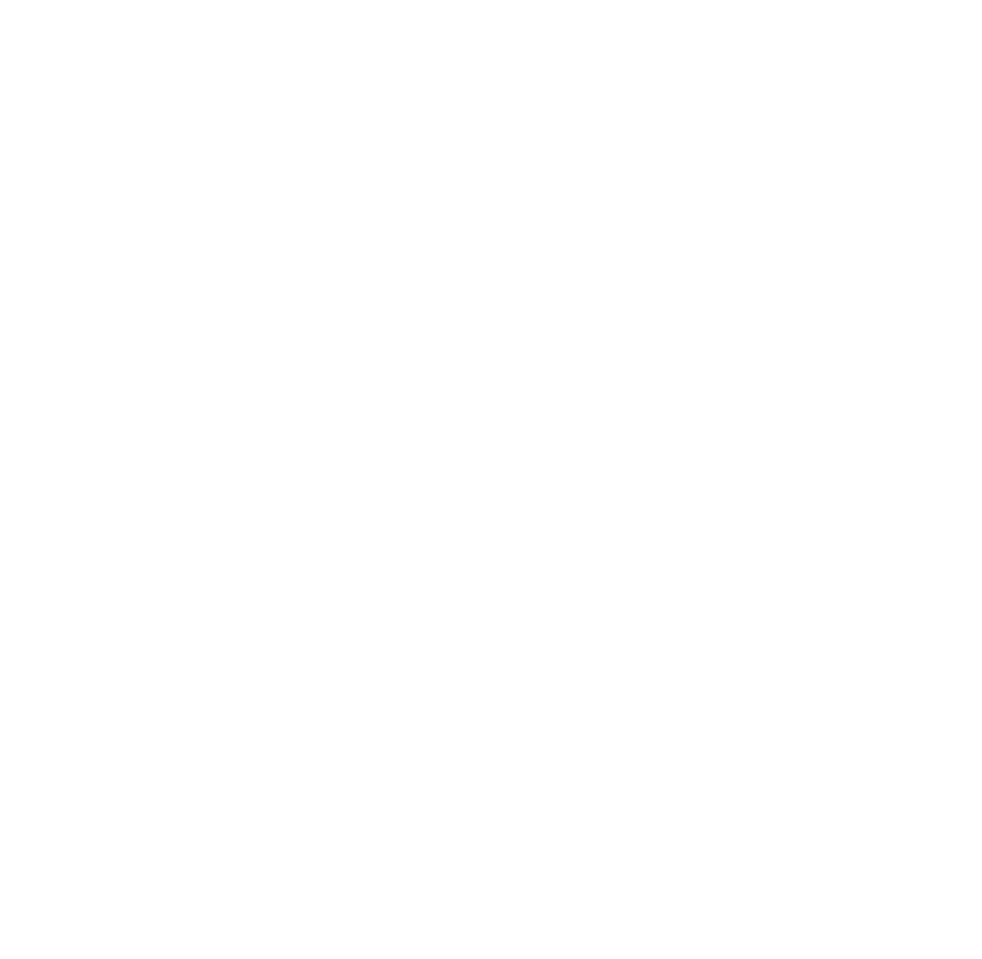

image user acitivity
0 522 480 7


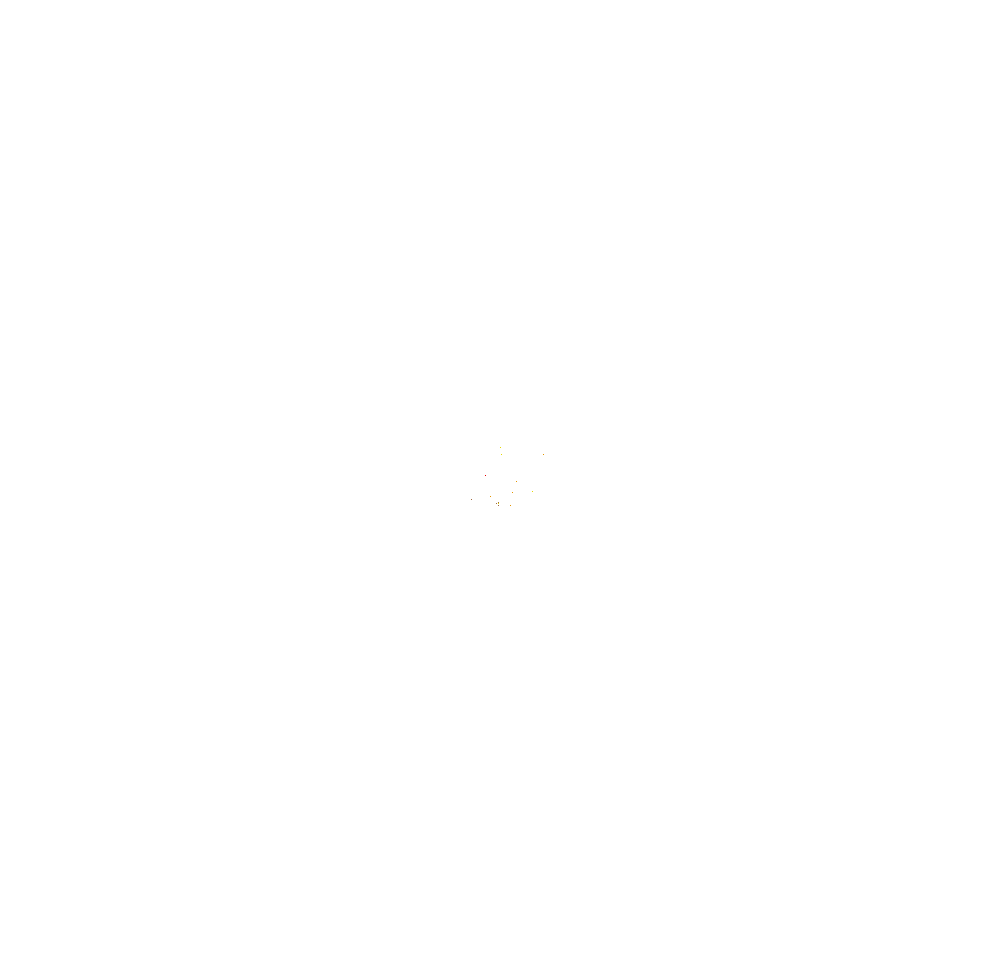

hour:  1
european_flag
image activity


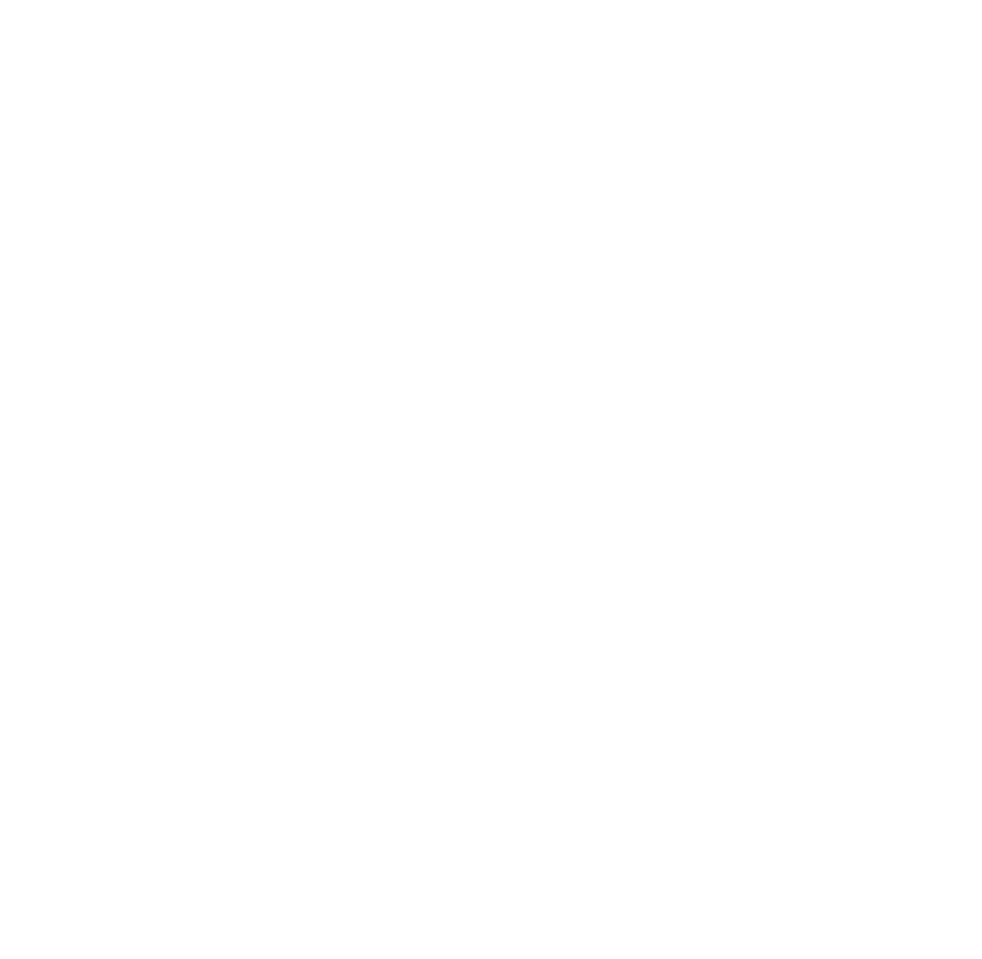

image user acitivity
0 522 480 7


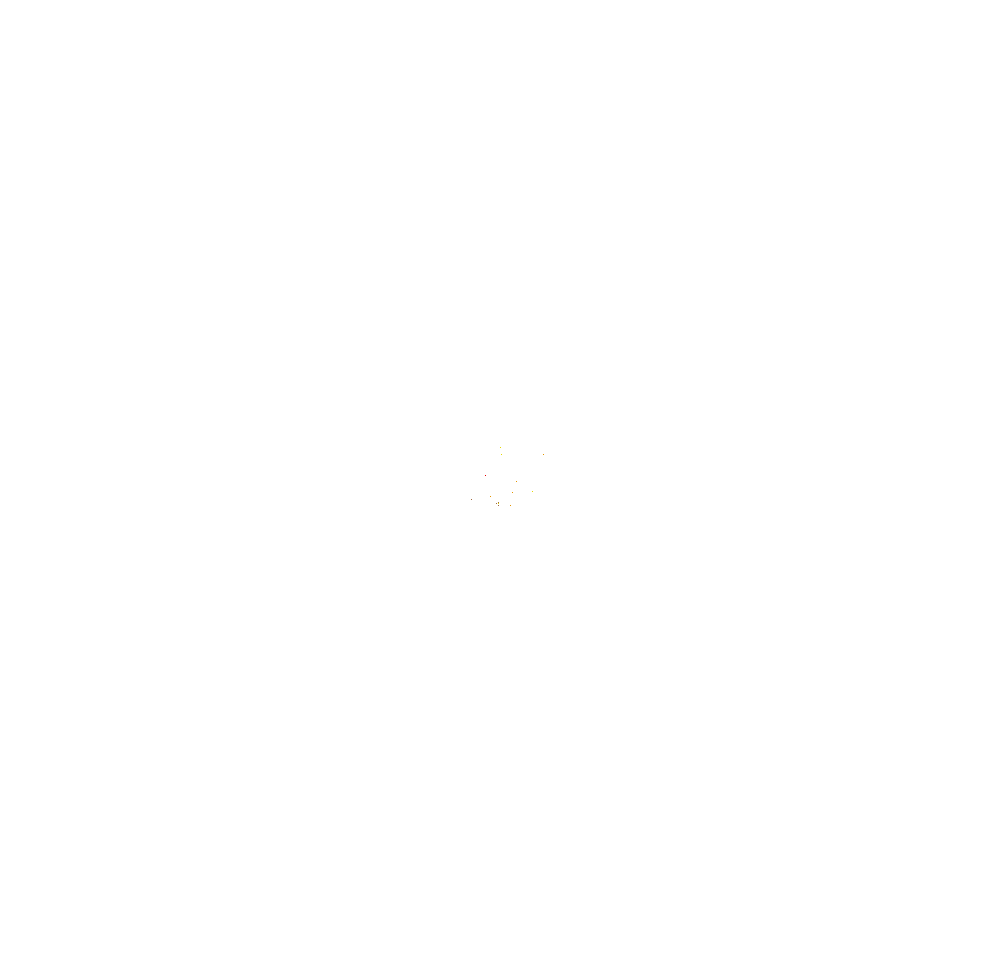

hour:  2
european_flag
image activity


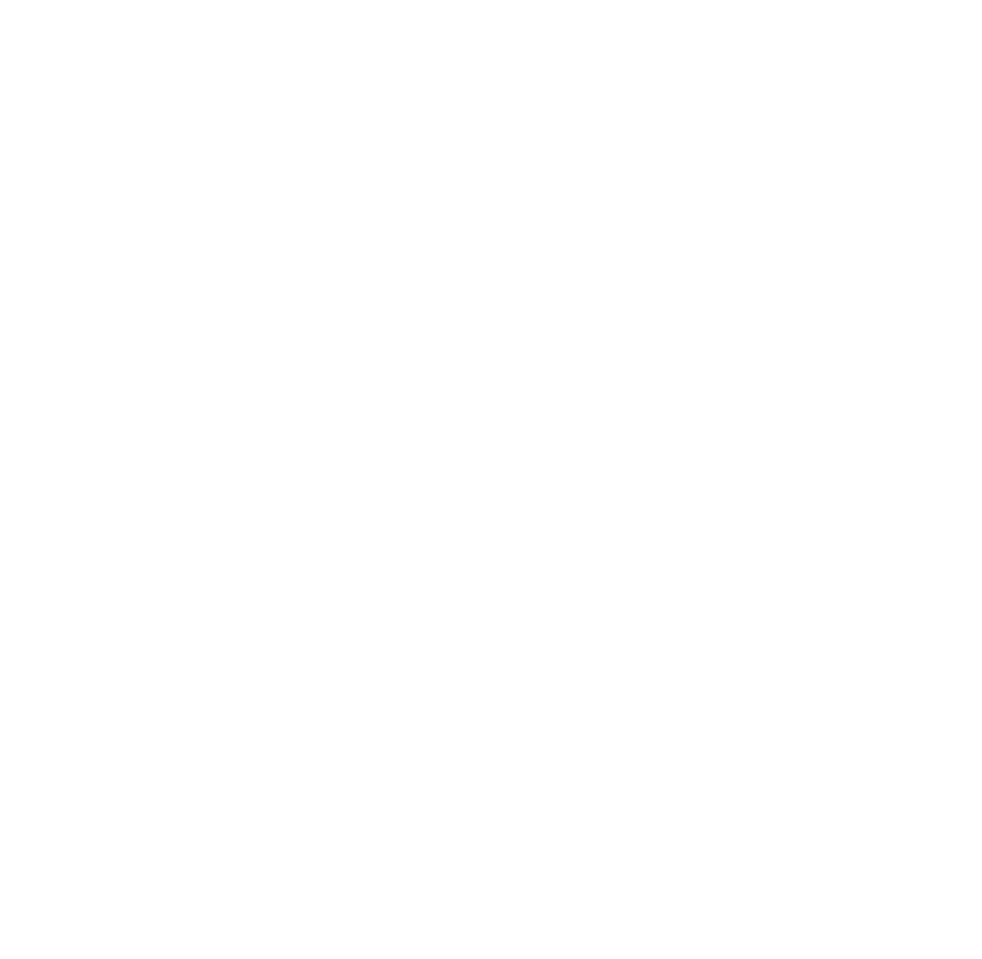

image user acitivity
0 522 480 7


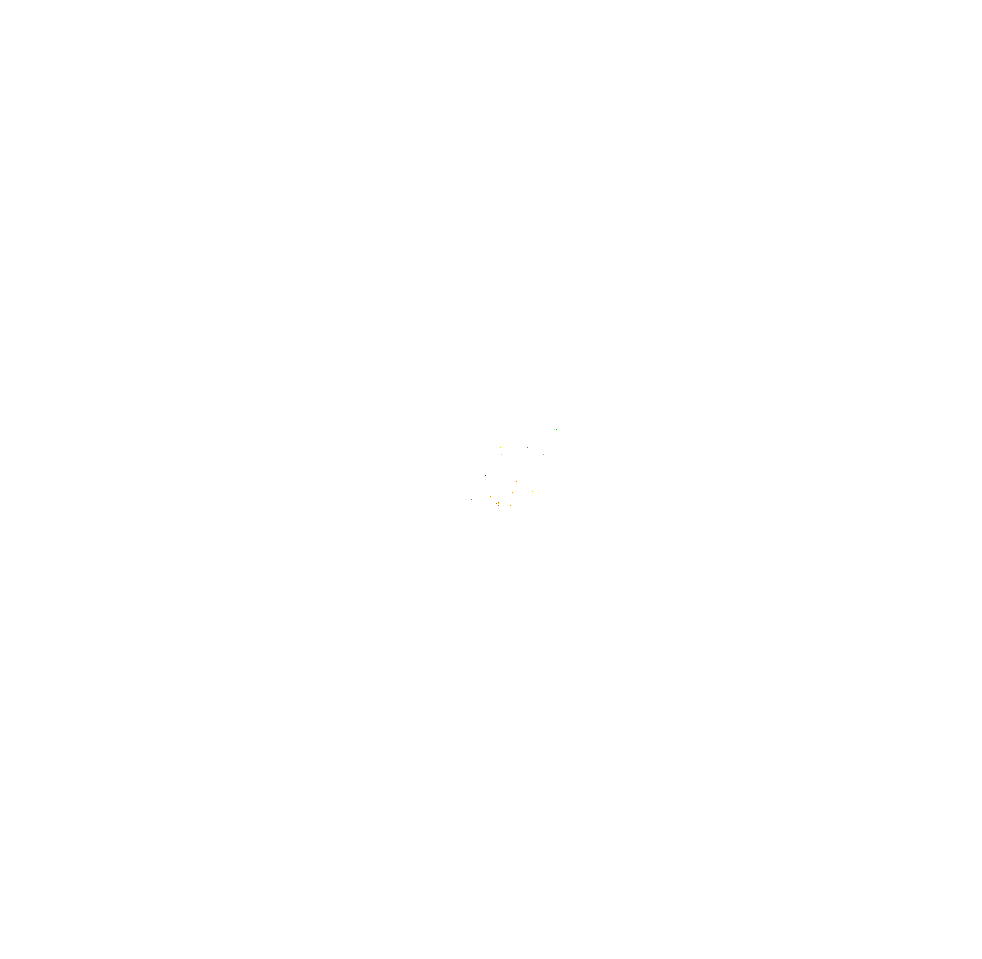

hour:  3
european_flag
image activity


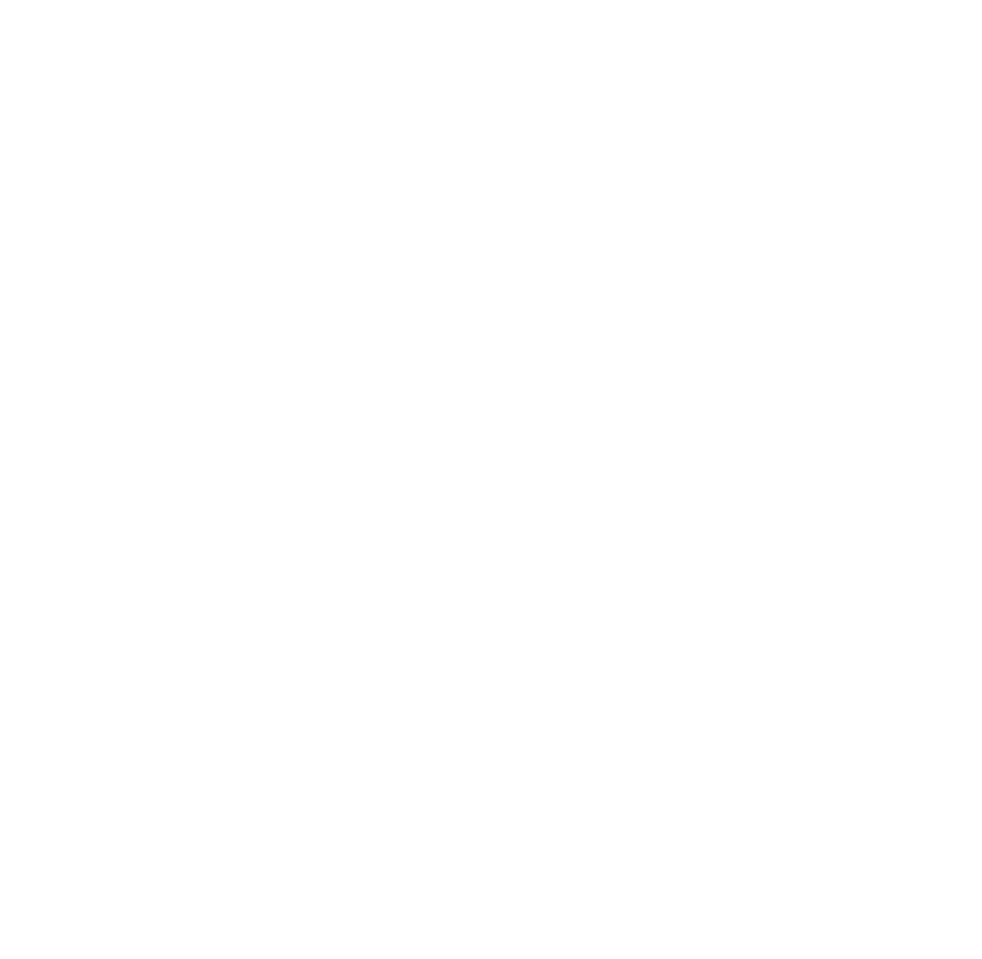

image user acitivity
0 522 480 7


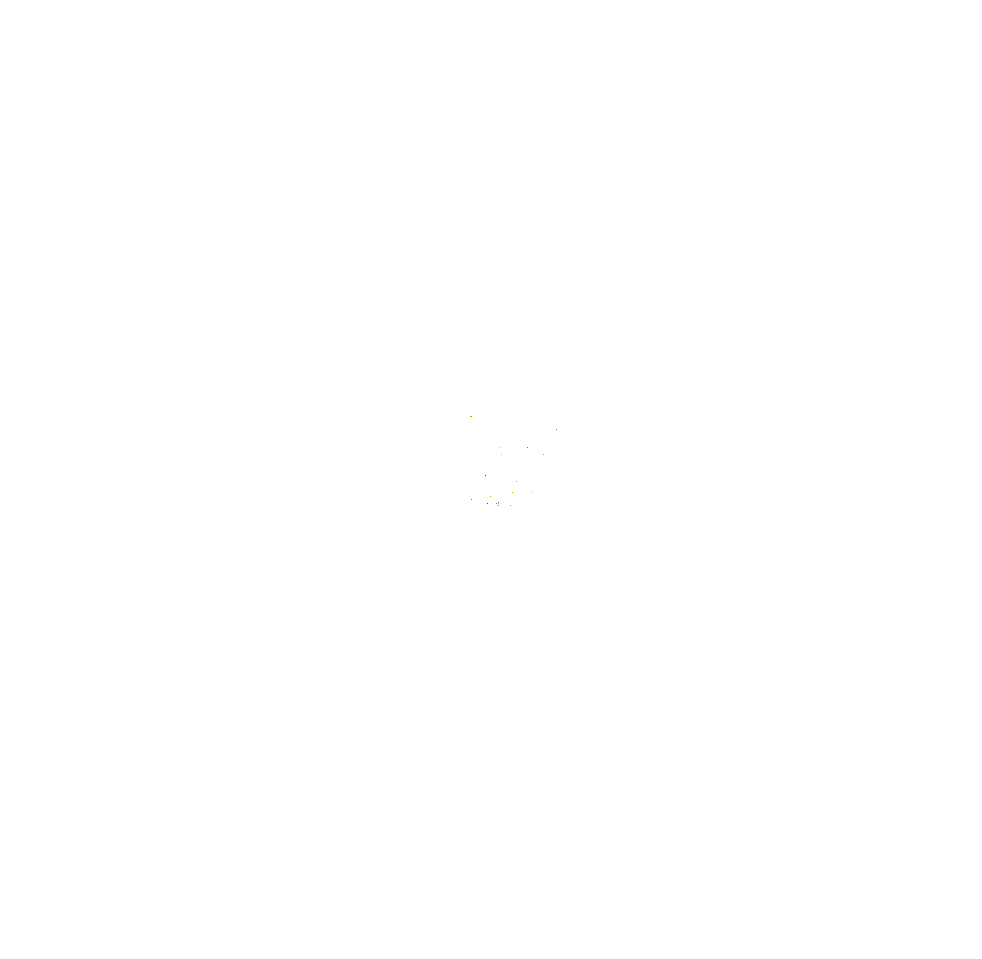

hour:  4
european_flag
image activity


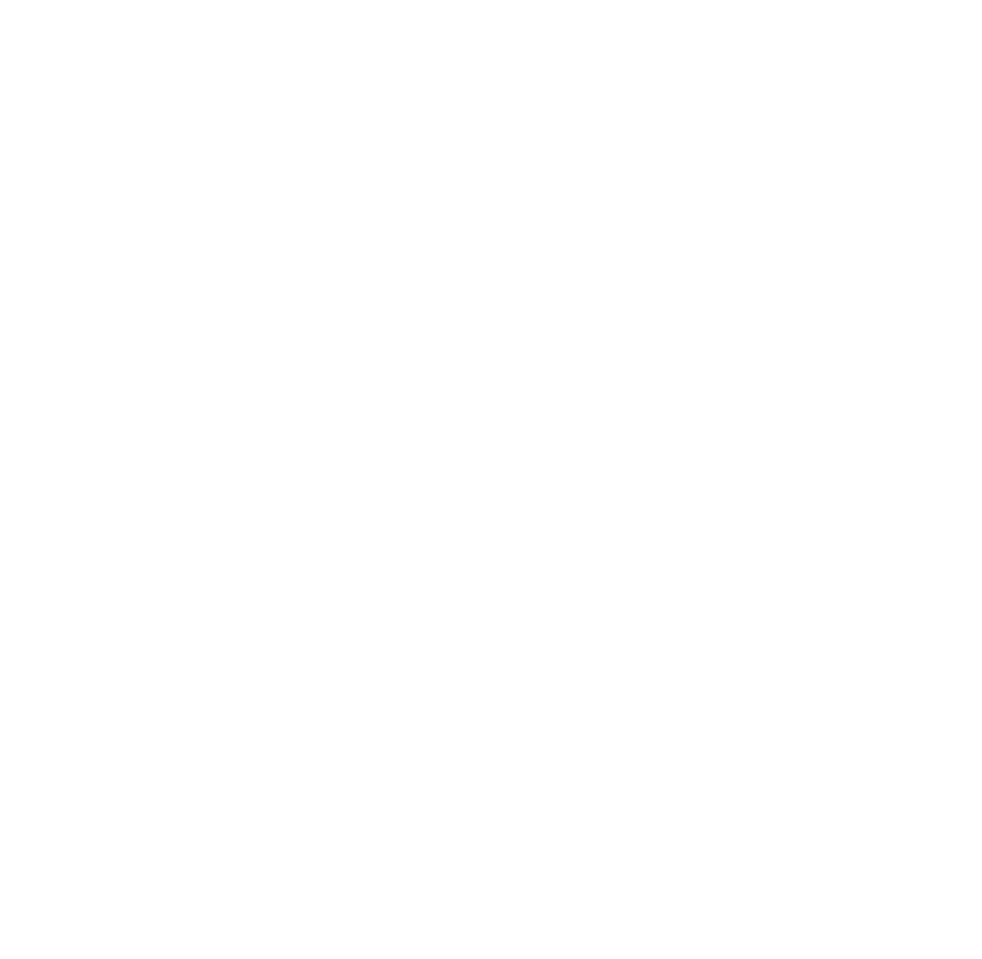

image user acitivity
0 522 480 7


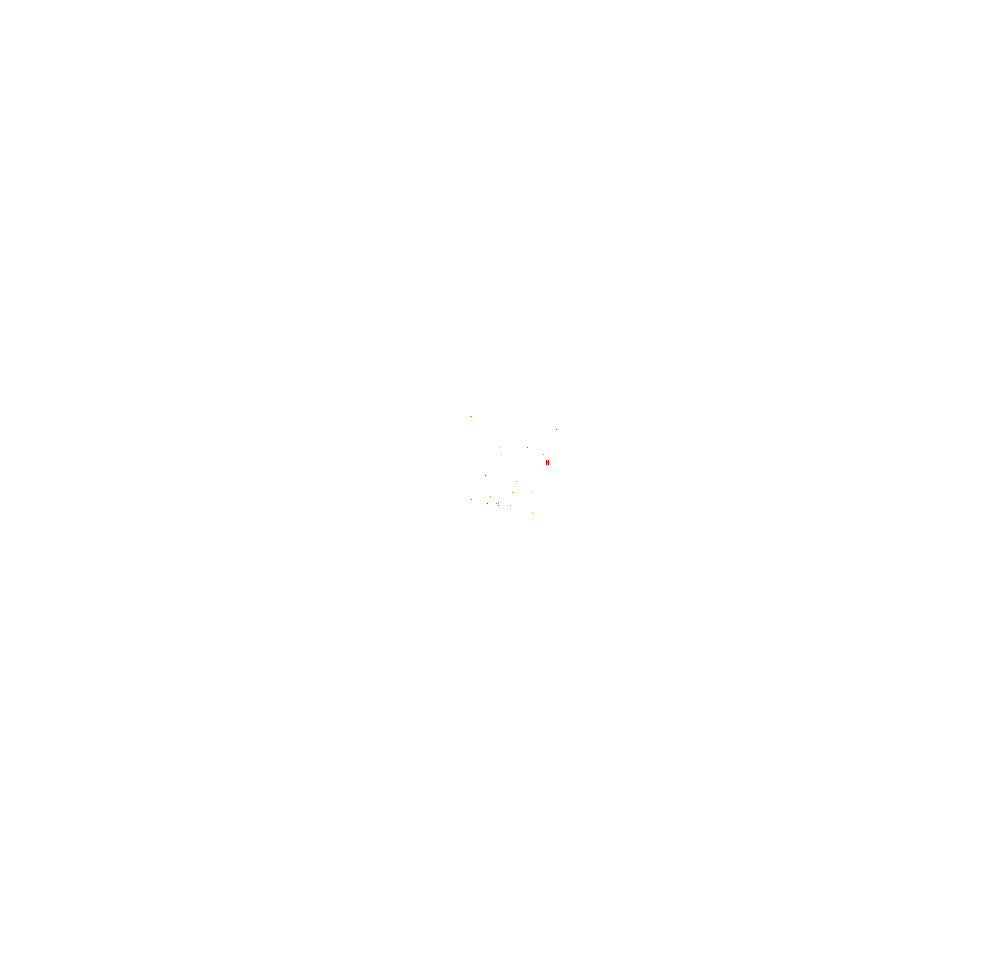

hour:  5
european_flag
image activity


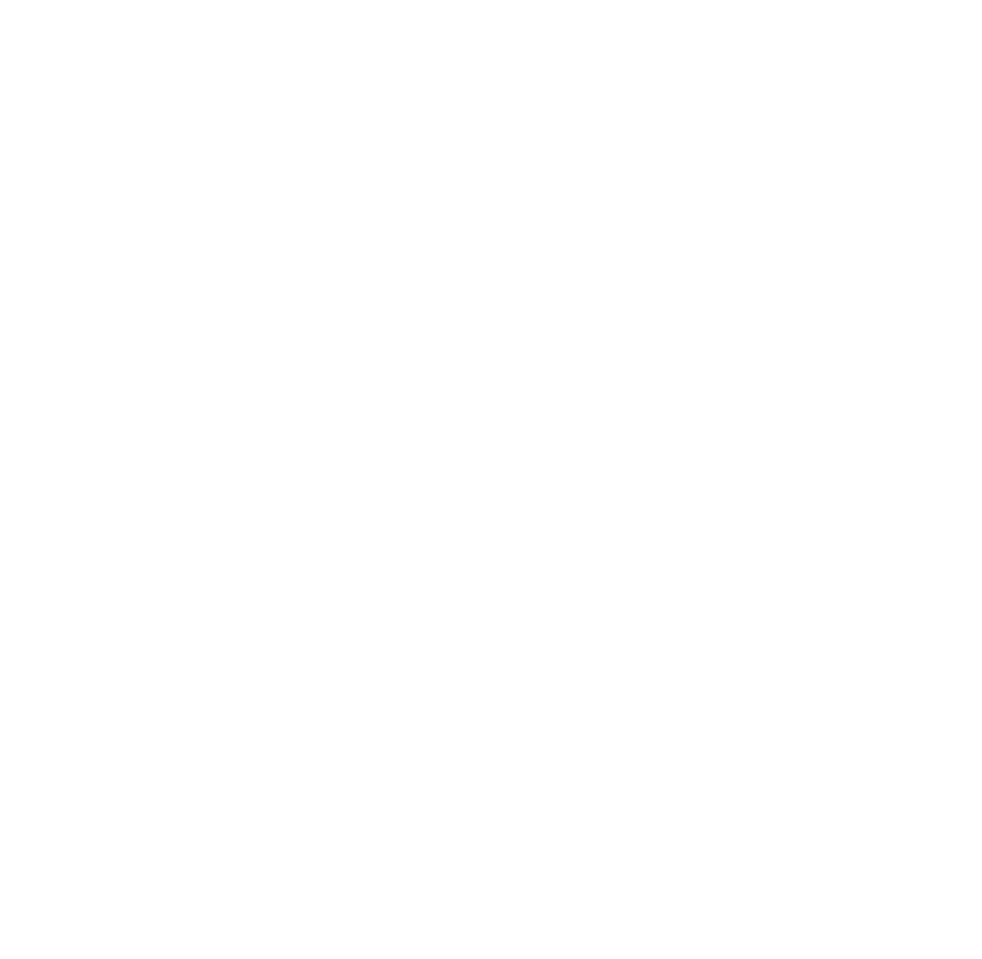

image user acitivity
0 522 480 7


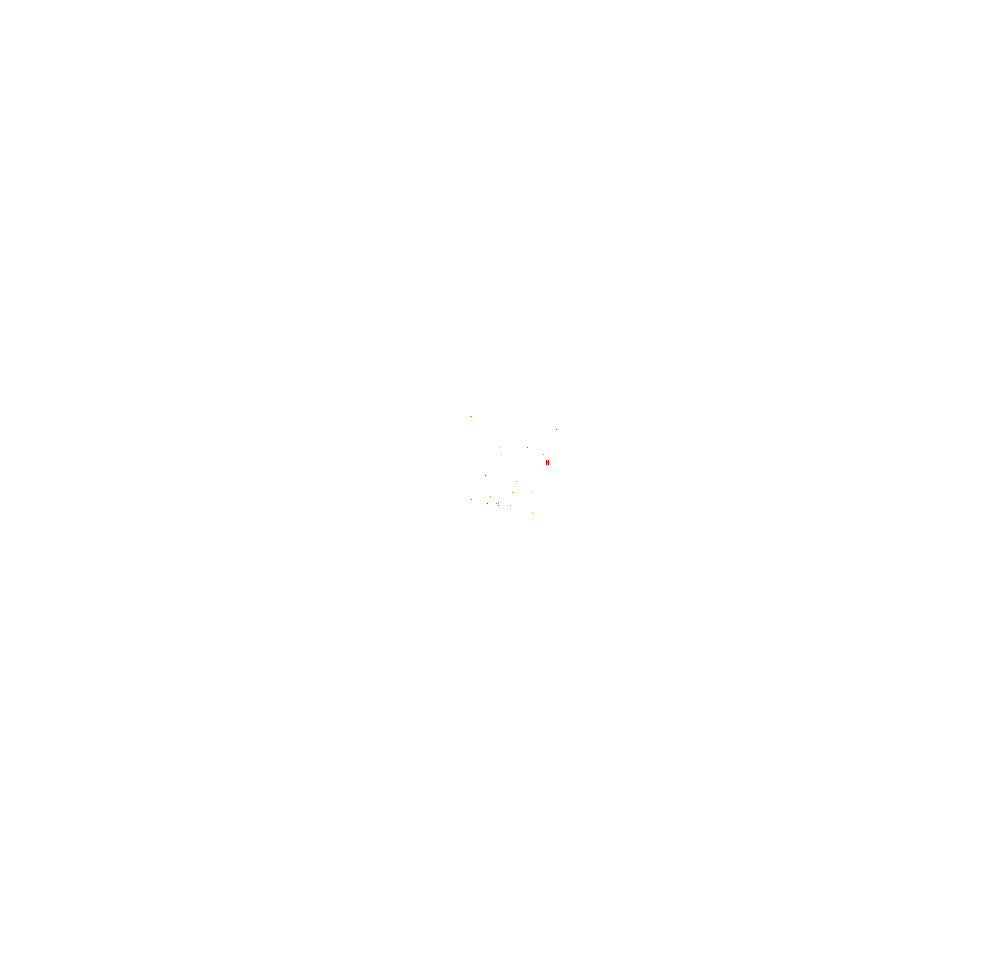

hour:  6
european_flag
image activity


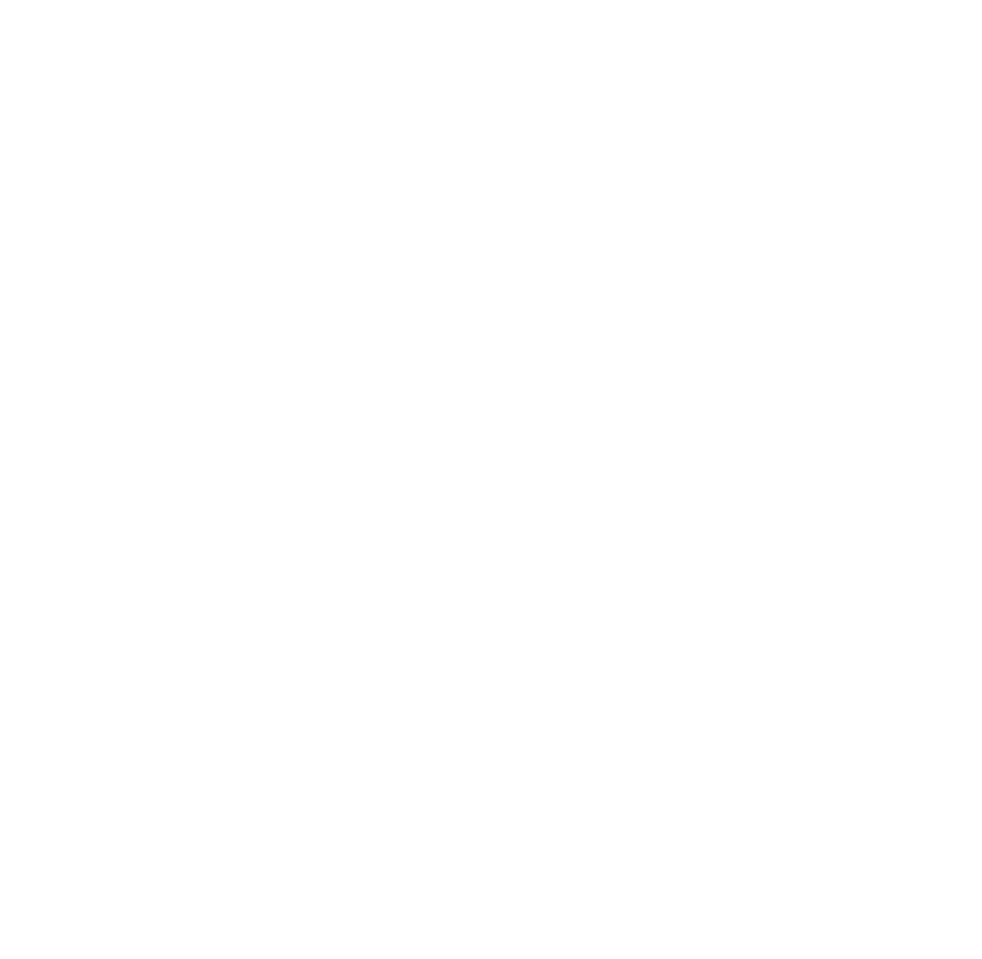

image user acitivity
0 522 480 7


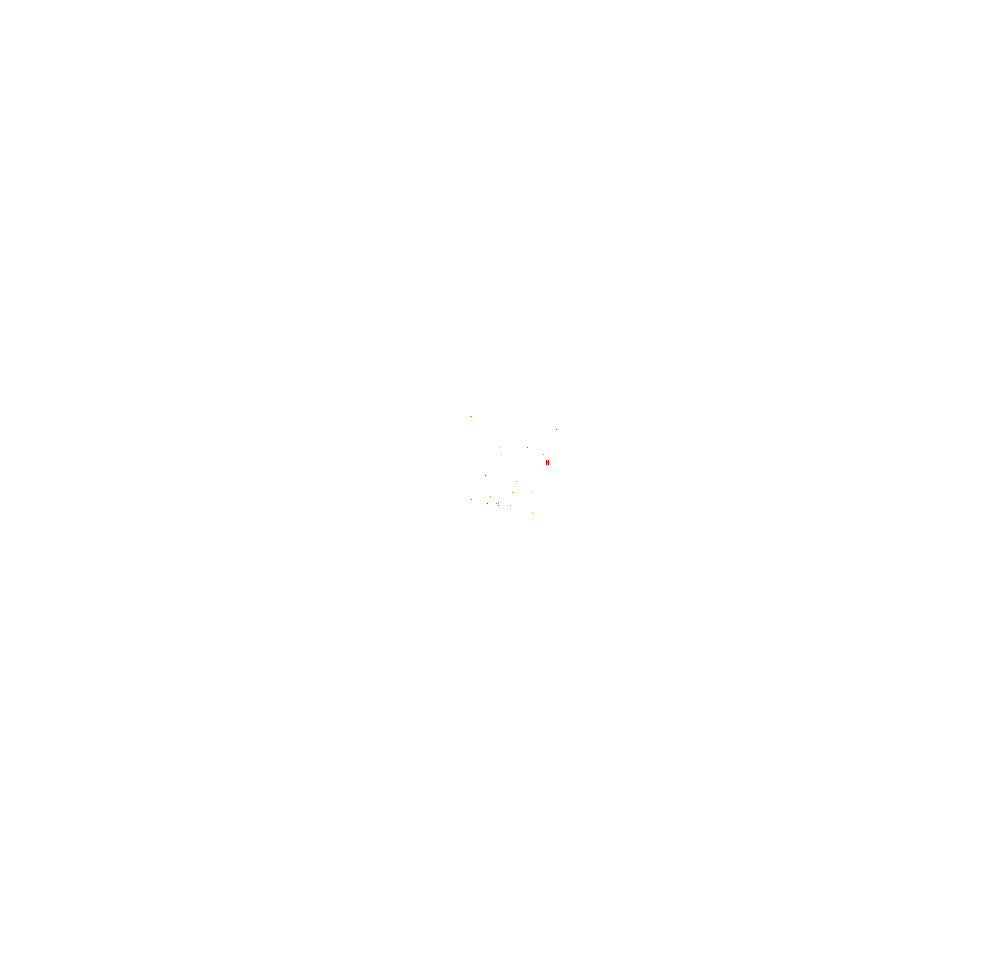

hour:  7
european_flag
image activity


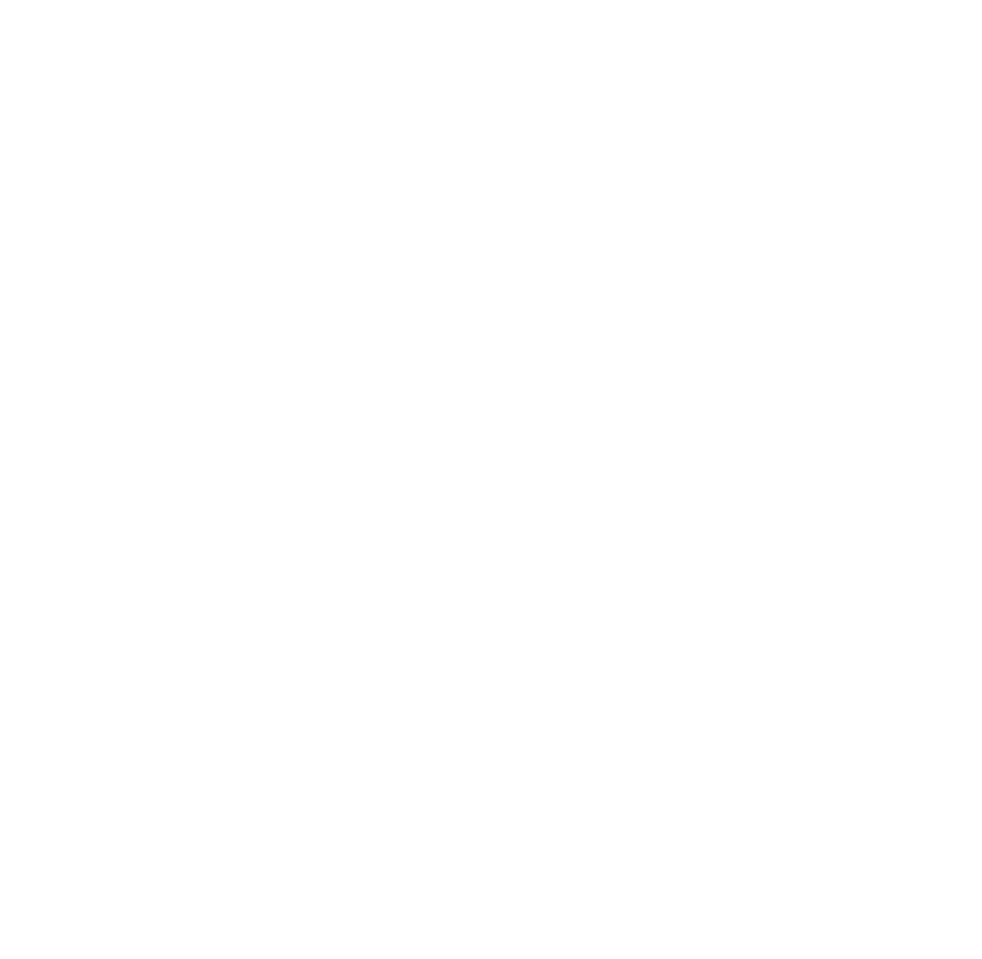

image user acitivity
0 522 480 7


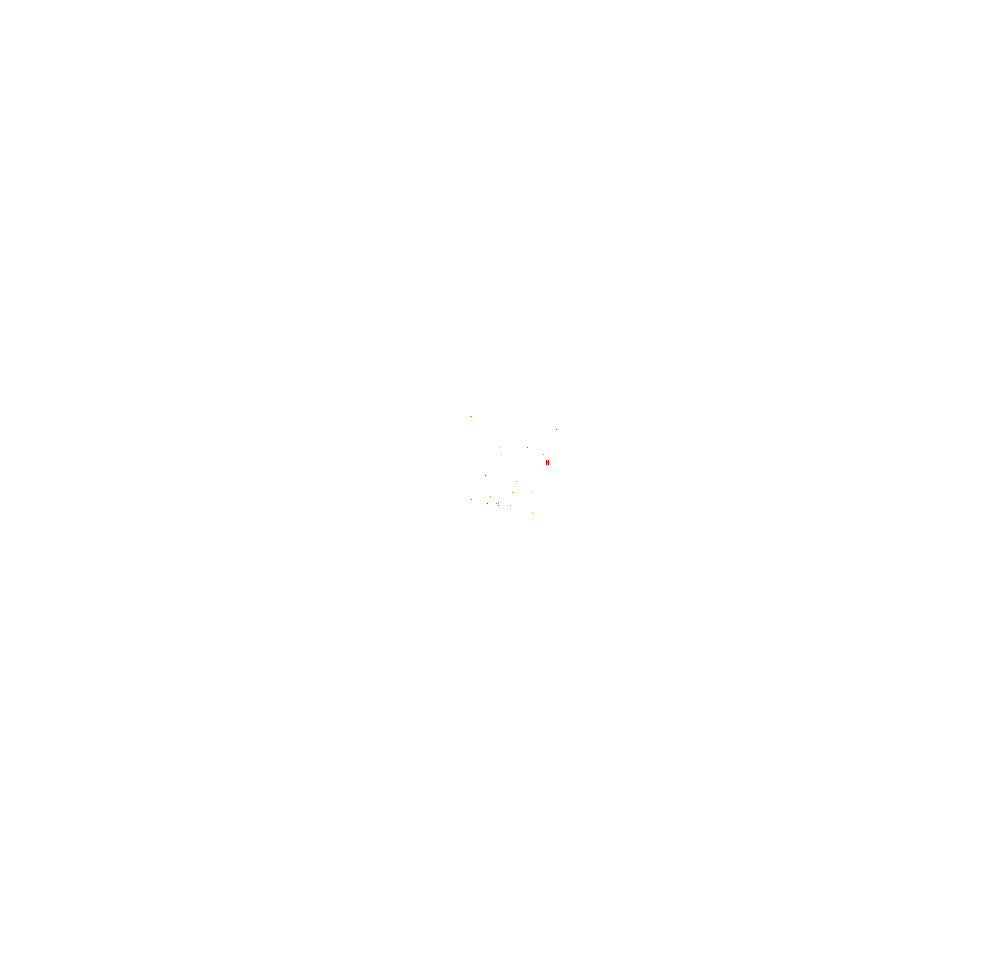

hour:  8
european_flag
image activity


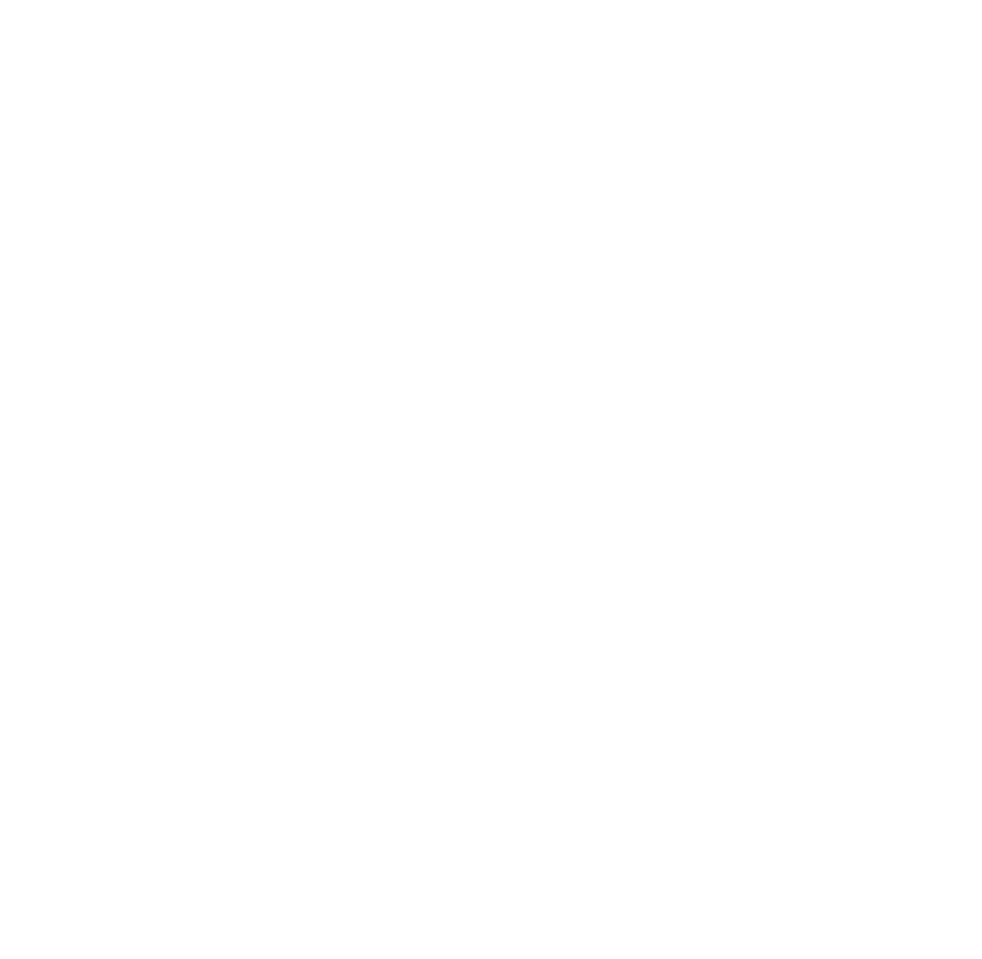

image user acitivity
0 522 480 7


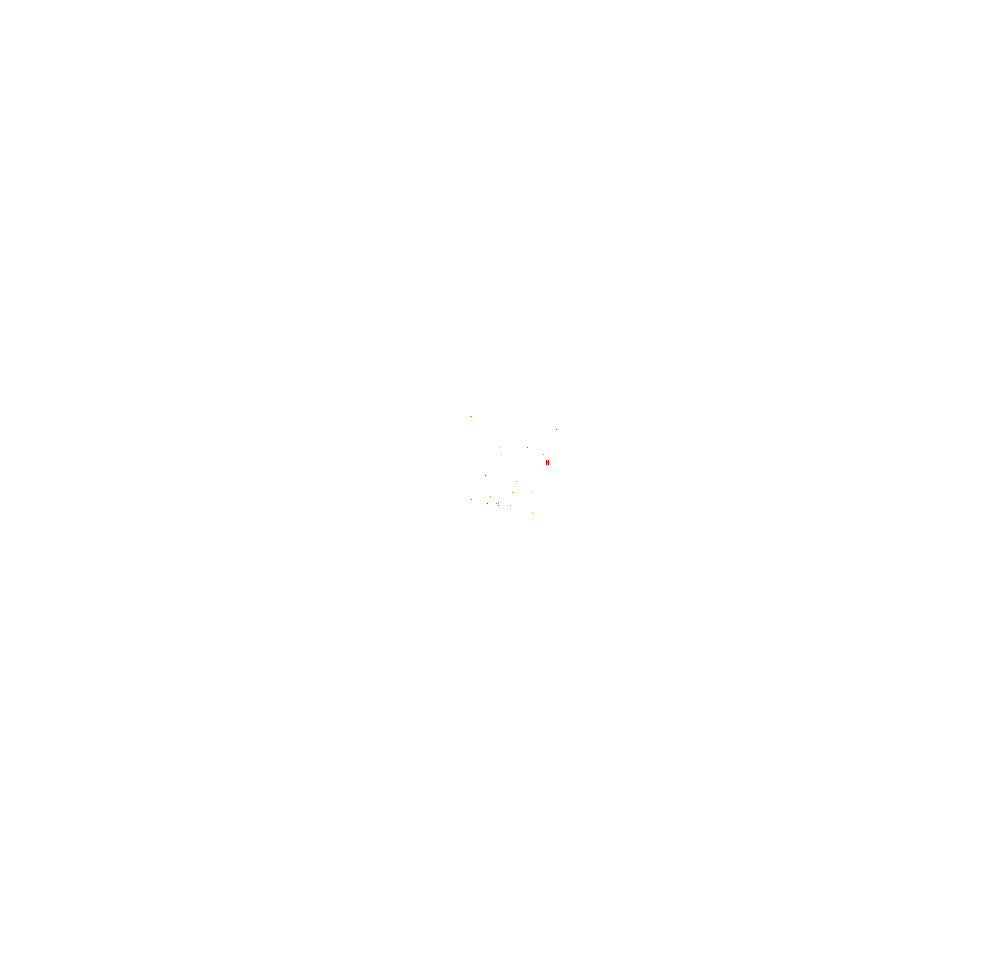

hour:  9
european_flag
image activity


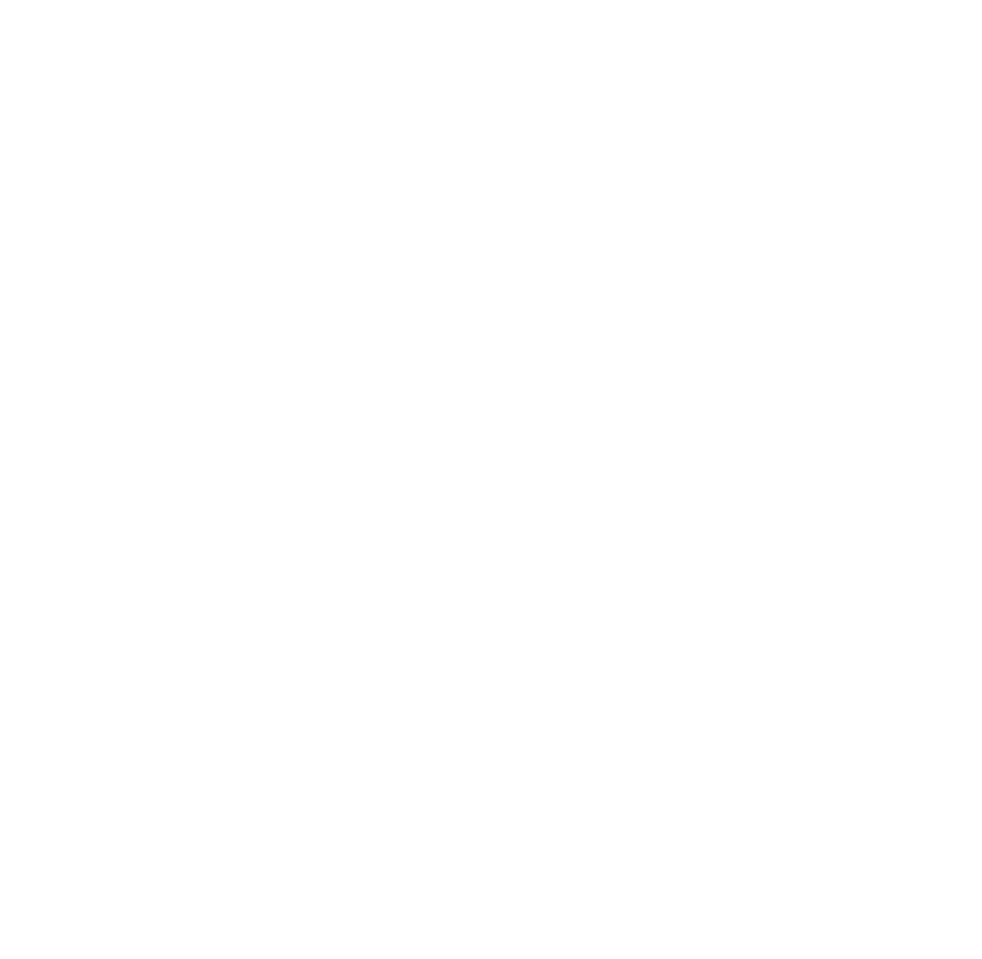

image user acitivity
0 522 480 7


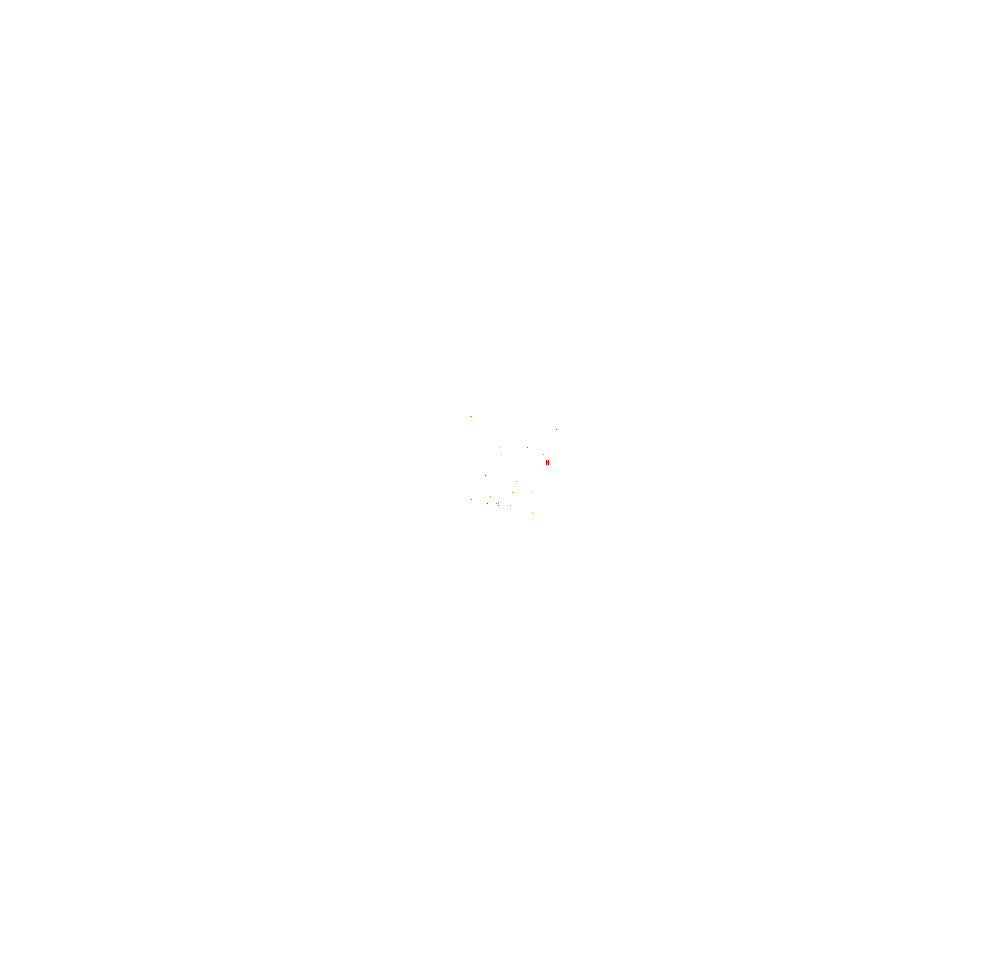

hour:  10
european_flag
image activity


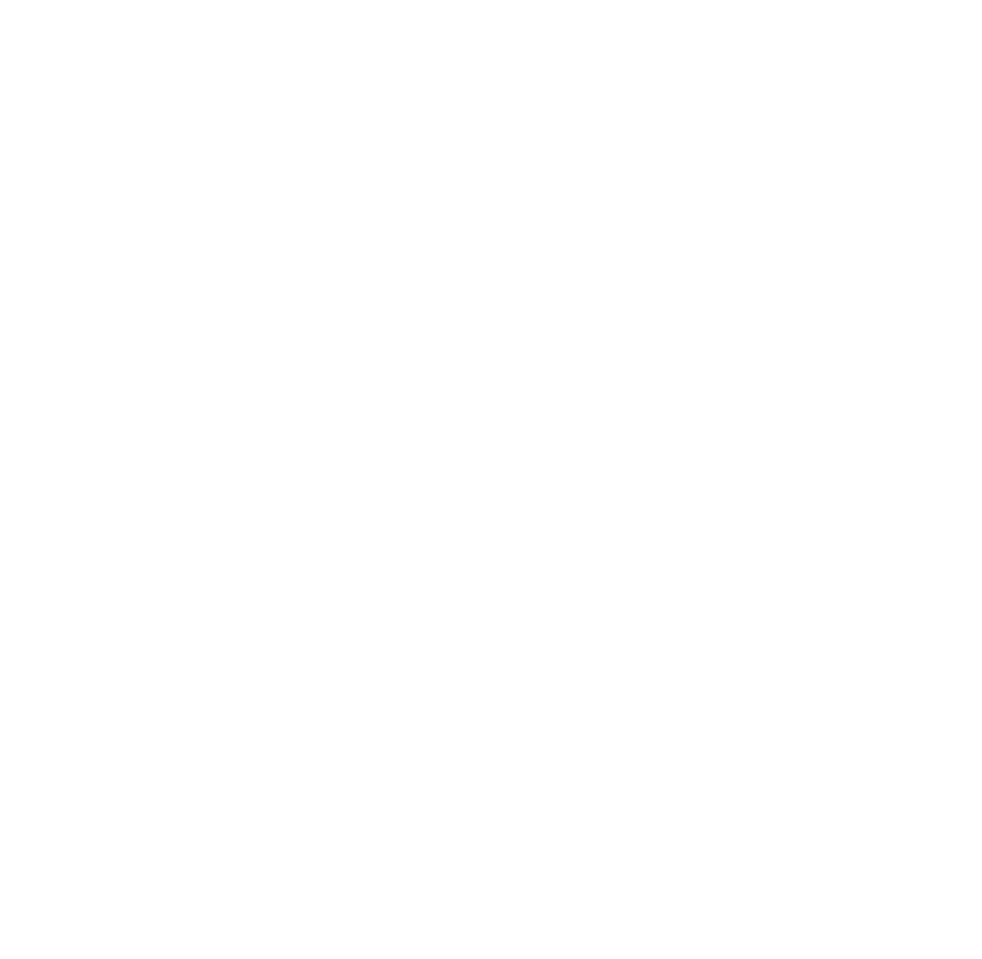

image user acitivity
0 522 480 7


KeyboardInterrupt: 

In [128]:
file_name = "image_coordinates.txt"
images = read_image_coordinates(file_name)

# event took place over the course of 72 hours
max_timepoint = 72
timepoints = create_timepoints(max_timepoint)
hour = 29
img_index = 3

image = images[img_index]

for hour,timepoint in enumerate(timepoints):
    print('hour: ', hour)
    image_df = filter_image_from_df(image,df)
    image_users = obtain_users_from_df(image_df)
    image_users_df = gather_all_users_from_df(df, image_users)
    image_users_df = image_users_df.sort_values('ts').reset_index(drop=True)


    image_df = image_df[image_df['ts'] <= timepoint*time]
    image_users_df = image_users_df[image_users_df['ts'] <= timepoint*time]
    timed_df = df[df['ts'] <= timepoints[hour]*time]

    print(image[0])
    print('image activity')
    display_on_canvas(image_df)
    print('image user acitivity')
    display_on_canvas(image_users_df)
#     print('complete overview at timepoint')
#     display_on_canvas(timed_df)